In [1]:
import h5py
import numpy as np
import matplotlib.pyplot as plt
import datetime
import seaborn as sns
import matplotlib as mpl
#mpl.rcParams['figure.dpi'] = 300
sns.set_theme()

In [2]:
a=np.array([[1,2,3],[4,5,6],[7,8,9]])
b=np.linalg.eig(a)[0]
print(b)
b.sort()
b=b[::-1]
print(b)

[ 1.61168440e+01 -1.11684397e+00 -9.75918483e-16]
[ 1.61168440e+01 -9.75918483e-16 -1.11684397e+00]


In [10]:
c=np.where(a==19)

In [13]:
c[0][0]

IndexError: index 0 is out of bounds for axis 0 with size 0

In [268]:
fp.close()

In [3]:
dirt='/home/tsw35/soteria/data/eddy_v2/old/ABBY_L2.h5'
fp2=h5py.File(dirt,'r')

In [4]:
# Load File
fp=h5py.File('/home/tsw35/soteria/neon_advanced/data/QAQCv4_neon_pntEB1_frez_H_H2_H2_T__US_UU_UV_UW_VV_VW_WS_WW_ZL.h5','r')# Sites
focus_sites=[b'WREF',b'NOGP',b'BART',b'SOAP','MAP',b'ORNL',b'SRER',b'KONZ',b'DSNY']
#focus_sites=[b'ABBY',b'SCBI',b'HARV',b'JERC','MAP',b'ORNL',b'TREE',b'OSBS',b'UNDE']
fpsites=fp['site'][:]
lats=fp['lat'][:]
lons=fp['lon'][:]
sites = []
nlat=[]
nlon=[]
fnlat=[]
fnlon=[]
for i in range(len(fpsites)):
    x=fpsites[i]
    if x not in sites:
        nlat.append(lats[i])
        nlon.append(lons[i])
        sites.append(x)
        if x in focus_sites:
            fnlat.append(lats[i])
            fnlon.append(lons[i])

In [5]:
fp2.close()

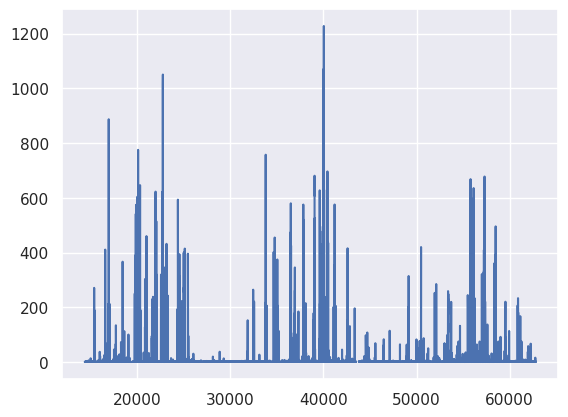

In [34]:
uu=fp['UU'][:]
uu[uu==-9999]=float('nan')
plt.plot(uu)
plt.show()

In [6]:
def aniso(uu,vv,ww,uv,uw,vw):
    n=len(uu)
    m=uu>-9999
    k=uu[m]+vv[m]+ww[m]
    aniso=np.ones((n,3,3))*-1
    aniso[m,0,0]=uu[m]/k-1/3
    aniso[m,1,1]=vv[m]/k-1/3
    aniso[m,2,2]=ww[m]/k-1/3
    aniso[m,0,1]=uv[m]/k
    aniso[m,1,0]=uv[m]/k
    aniso[m,2,0]=uw[m]/k
    aniso[m,0,2]=uw[m]/k
    aniso[m,1,2]=vw[m]/k
    aniso[m,2,1]=vw[m]/k
    return aniso

In [118]:
btij=aniso(fp['UU'][:],fp['VV'][:],fp['WW'][:],fp['UV'][:],fp['UW'][:],fp['VW'][:])
y_b=np.zeros((len(uu),))
for i in range(len(uu)):
    lam3=np.min(np.linalg.eig(btij[i,:,:])[0])
    y_b[i]=np.sqrt(3)/2*(3*lam3+1)

In [49]:
uu=fp['WW'][:]
m=uu>-9999
np.sum(m)

47340

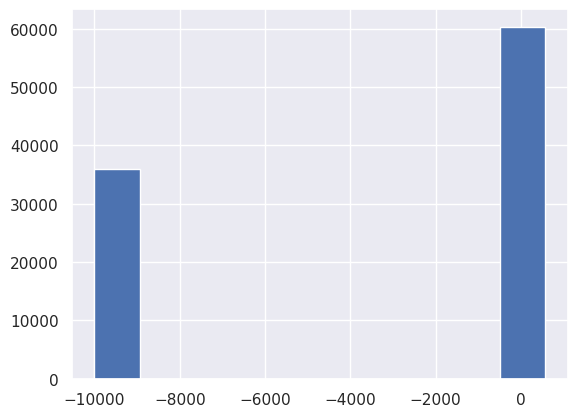

In [90]:
plt.hist(fp['ZL'][:])
plt.show()

In [41]:
zl=fp['ZL'][:]

In [56]:
zl=fp['ZL'][:]
m=m&(zl<0.00001)&(zl>-10**(3))

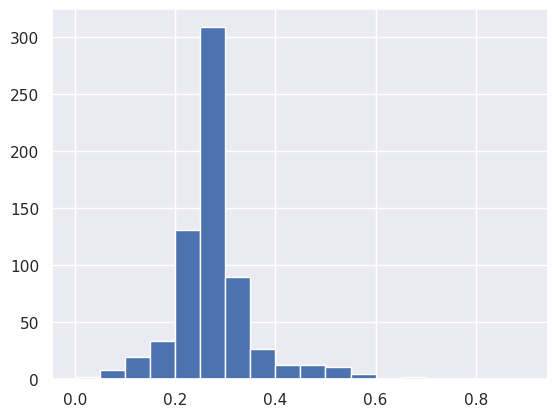

In [179]:
plt.hist(y_b[m],bins=np.linspace(0,.9,19))
plt.show()

In [57]:
normU=np.sqrt(fp['UU'][m])/(fp['USTAR'][m]+.00001)

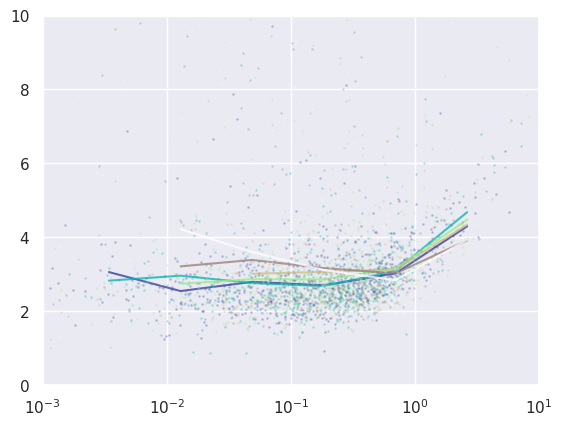

In [87]:
binlist=[.1,.25,.4,.55,.7,.85]
colors = plt.cm.terrain(np.linspace(0,1,len(binlist)))
for i in range(len(binlist)):
    ir=binlist[i]
    m2=(y_b[m]<ir)&(y_b[m]>(ir-.1))
    un=normU[m2]
    zlp=-zl[m][m2]
    plt.semilogx(zlp,un,'.',alpha=.2,ms=2,color=colors[i])
    zlbins=np.logspace(-4,1.2,10)
    zlout=[]
    unout=[]
    for j in range(1,10):
        zlout.append((zlbins[j]+zlbins[j-1])/2)
        m3=(zlp>zlbins[j-1])&(zlp<zlbins[j])&(un<10)
        if np.sum(m3)<=10:
            unout.append(float('nan'))
        else:
            unout.append(np.mean(un[m3]))
    plt.semilogx(zlout,unout,'-',alpha=.75,color=colors[i])
                         
plt.ylim(0,10)
plt.xlim(10**(-3),10**(1))
plt.show()

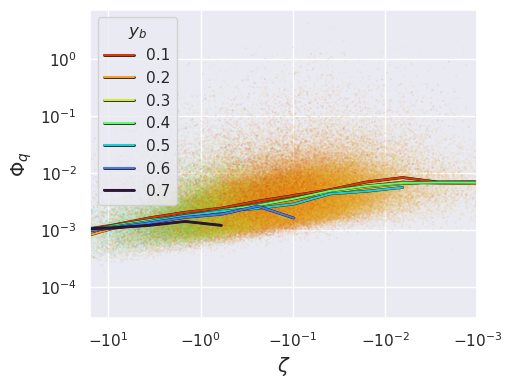

In [321]:
fp=h5py.File('/home/tsw35/soteria/neon_advanced/data/QAQCv4_neon_pntEB1_frez_H_H2_H2_T__US_UU_UV_UW_VV_VW_WS_WW_ZL.h5','r')
binlist=[.05,.15,.25,.35,.45,.55,.65,.75]
import matplotlib.patheffects as pe
plt.figure(figsize=(5,4),dpi=100)

m=(zl<0.000001)
m=m&(fp['LE'][:]>0.1)
ybnorm=np.array(y_b)[m]
ybnorm=ybnorm/(np.sqrt(3)/2)
colors=plt.cm.turbo(1-ybnorm)
#un=np.sqrt(fp['UU'][m])/(fp['USTAR'][m]+.00001)

un=np.sqrt(fp['H2O_SIGMA'][m])*(fp['USTAR'][m])/fp['LE'][m]
normU=np.sqrt(fp['H2O_SIGMA'][m])*(fp['USTAR'][m])/fp['LE'][m]

plt.scatter(-zl[m],un,alpha=.1,s=.1,color=colors,label=None)




colors = plt.cm.turbo(np.linspace(1,0,len(binlist)))

for i in range(1,len(binlist)):
    ir=binlist[i]
    m2=(y_b[m]<ir)&(y_b[m]>(ir-.1))
    un=normU[m2]
    zlp=-zl[m][m2]
    #plt.semilogx(zlp,un,'.',alpha=.2,ms=2,color=colors[i])
    zlbins=np.logspace(-4,1.5,15)
    zlout=[]
    unout=[]
    for j in range(1,15):
        zlout.append((zlbins[j]+zlbins[j-1])/2)
        m3=(zlp>zlbins[j-1])&(zlp<zlbins[j])&(un<10)
        if np.sum(m3)<=10:
            unout.append(float('nan'))
        else:
            unout.append(np.median(un[m3]))
    #plt.loglog(zlout,unout,'-',alpha=.75,color=colors[i])
    plt.loglog(zlout,unout,'-',alpha=1,color=colors[i],path_effects=[pe.Stroke(linewidth=2, foreground='k'), pe.Normal()],label=str(round(ir-.05,1)))
plt.legend(loc='upper left',title=r'$y_b$')
#plt.ylim(.0009,.01)
plt.xlim(10**(-3),10**(1.2))
plt.xticks([10,1,.1,.01,.001],[r'$-10^1$',r'$-10^0$',r'$-10^{-1}$',r'$-10^{-2}$',r'$-10^{-3}$'])
plt.gca().invert_xaxis()
plt.xlabel(r'$\zeta$',fontsize=14)
plt.ylabel(r'$\Phi_q$',fontsize=14)
plt.show()

In [91]:
fp.close()

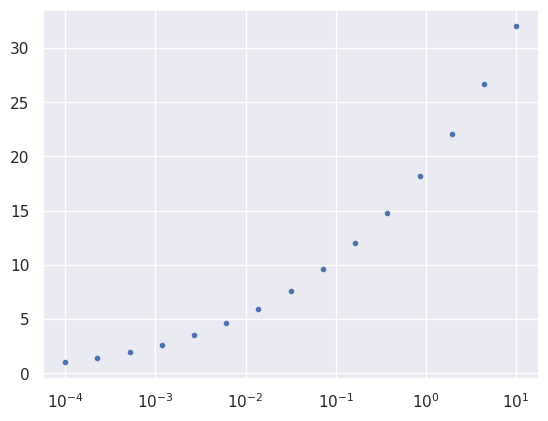

In [76]:
plt.semilogx(a,np.linspace(1,2,15)**5,'.')
plt.show()

In [80]:
zlbins

array([1.00000000e-04, 2.27584593e-04, 5.17947468e-04, 1.17876863e-03,
       2.68269580e-03, 6.10540230e-03, 1.38949549e-02, 3.16227766e-02,
       7.19685673e-02, 1.63789371e-01, 3.72759372e-01, 8.48342898e-01,
       1.93069773e+00, 4.39397056e+00, 1.00000000e+01])

In [2]:
fp=h5py.File('/home/tsw35/soteria/neon_advanced/data/QAQCv4_neon_pntEB1_frez_H_H2_H2_T__US_UU_UV_UW_VV_VW_WS_WW_ZL.h5','r')

OSError: Unable to open file (unable to open file: name = '/home/tsw35/soteria/neon_advanced/data/QAQCv4_neon_pntEB1_frez_H_H2_H2_T__US_UU_UV_UW_VV_VW_WS_WW_ZL.h5', errno = 2, error message = 'No such file or directory', flags = 0, o_flags = 0)

In [223]:
uu=fp['UU'][:]
btij=aniso(fp['UU'][:],fp['VV'][:],fp['WW'][:],fp['UV'][:],fp['UW'][:],fp['VW'][:])
y_b=np.zeros((len(uu),))
for i in range(len(uu)):
    lam3=np.min(np.linalg.eig(btij[i,:,:])[0])
    y_b[i]=np.sqrt(3)/2*(3*lam3+1)

In [160]:
btij.shape

(248786, 3, 3)

In [226]:
zl=fp['ZL'][:]
m=(zl<0.000001)

In [227]:
normU=np.sqrt(fp['UU'][m])/(fp['USTAR'][m]+.00001)
#normU=np.sqrt(fp['T_SONIC_SIGMA'][m])*(fp['USTAR'][m])/fp['H'][m]

In [12]:
iva_colors_HEX = ["#410d00","#831901","#983e00","#b56601","#ab8437",
              "#b29f74","#7f816b","#587571","#596c72","#454f51"]
 
#Transform the HEX colors to RGB.
from PIL import ImageColor
 
iva_colors_RGB = np.zeros((np.size(iva_colors_HEX),3),dtype='int')
 
for i in range(0,np.size(iva_colors_HEX)):
    iva_colors_RGB[i,:] = ImageColor.getcolor(iva_colors_HEX[i], "RGB")

iva_colors_RGB = iva_colors_RGB[:,:]/(256)
 
#Transform the array of colors to a list of values.
colors = iva_colors_RGB.tolist()
#----------------------------------------------------
 
#The next few lines create a new colormap using IVA's colors:
from matplotlib.colors import LinearSegmentedColormap,ListedColormap
 
inbetween_color_amount = 10
 
# the 10 is from the original 10 colors, the 4 is for R, G, B, A
newcolvals = np.zeros(shape=(10 * (inbetween_color_amount) - (inbetween_color_amount - 1), 3))
 
# add first one already
newcolvals[0] = colors[0]
 
for i, (rgba1, rgba2) in enumerate(zip(colors[:-1], np.roll(colors, -1, axis=0)[:-1])):
    for j, (p1, p2) in enumerate(zip(rgba1, rgba2)):
        flow = np.linspace(p1, p2, (inbetween_color_amount + 1))
        # discard first 1 since we already have it from previous iteration
        flow = flow[1:]
        newcolvals[ i * (inbetween_color_amount) + 1 : (i + 1) * (inbetween_color_amount) + 1, j] = flow

newcolvals
 
cmap = ListedColormap(newcolvals, name='from_list', N=None)

In [244]:
np.sqrt(3)/2

0.8660254037844386

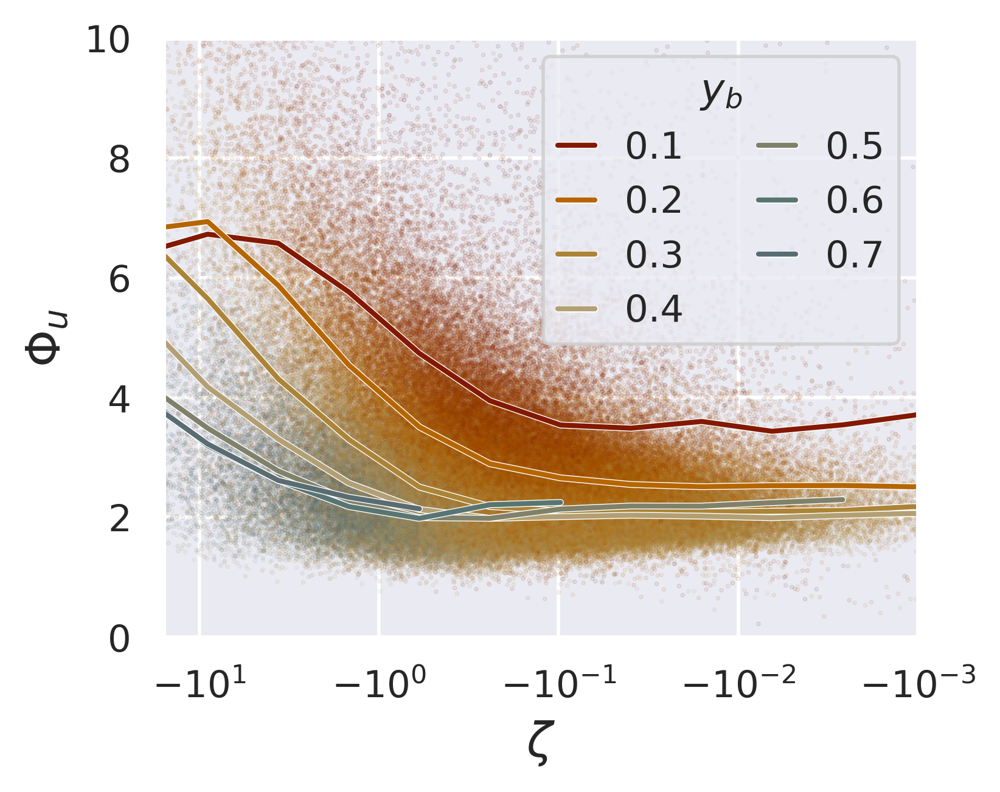

In [266]:
binlist=[.05,.15,.25,.35,.45,.55,.65,.75]
import matplotlib.patheffects as pe
plt.figure(figsize=(5*.8,4*.8),dpi=400)

ybnorm=np.array(y_b)[zl<0.000001]
m=(zl<0.000001)
ybnorm=ybnorm/(.7)
colors=cmap(ybnorm)
un=np.sqrt(fp['UU'][m])/(fp['USTAR'][m]+.00001)
plt.scatter(-zl[m],un,alpha=.15,s=.1,color=colors,label=None)




colors = plt.cm.turbo(np.linspace(1,0,len(binlist)))
#colors =["#410d00","#831901","#983e00","#b56601","#ab8437",
#             "#b29f74","#7f816b","#587571","#596c72"]

colors = ["#410d00","#831901","#b56601","#ab8437",
             "#b29f74","#7f816b","#587571","#596c72"]

for i in range(1,len(binlist)):
    ir=binlist[i]
    m2=(y_b[m]<ir)&(y_b[m]>(ir-.1))
    un=normU[m2]
    zlp=-zl[m][m2]
    #plt.semilogx(zlp,un,'.',alpha=.2,ms=2,color=colors[i])
    zlbins=np.logspace(-4,1.5,15)
    zlout=[]
    unout=[]
    for j in range(1,15):
        zlout.append((zlbins[j]+zlbins[j-1])/2)
        m3=(zlp>zlbins[j-1])&(zlp<zlbins[j])&(un<10)
        if np.sum(m3)<=5:
            unout.append(float('nan'))
        else:
            unout.append(np.mean(un[m3]))
    #plt.loglog(zlout,unout,'-',alpha=.75,color=colors[i])
    plt.semilogx(zlout,unout,'-',alpha=1,color=colors[i],path_effects=[pe.Stroke(linewidth=2, foreground='w'), pe.Normal()],label=str(round(ir-.05,1)))
plt.legend(loc='upper right',title=r'$y_b$',ncol=2,handlelength=1)
plt.ylim(0,10)
plt.xlim(10**(-3),10**(1.2))
plt.xticks([10,1,.1,.01,.001],[r'$-10^1$',r'$-10^0$',r'$-10^{-1}$',r'$-10^{-2}$',r'$-10^{-3}$'])
plt.gca().invert_xaxis()
plt.xlabel(r'$\zeta$',fontsize=14)
plt.ylabel(r'$\Phi_u$',fontsize=14)
plt.savefig('aniso_5.png')

In [ ]:
round()

In [6]:
fpsites=fp['site'][:]
sites=np.unique(fpsites)

In [10]:
# ------------------- #
# NLCD PREP NO FIGURE #
# ------------------- #
nlcd_dom = fp['nlcd_dom'][:]
sites =[]
fpsites = fp['site'][:]
npoints =0
apoints =0
nsites=0
asites=0
nlcds = {}
site_nlcds={}
nlcd_sums={}
site_nlcd_dom={}
i=0
for point in fpsites:
    if point not in sites:
        sites.append(point)
        site_nlcds[point]=[]
        for k in fp.keys():
            if 'nlcd' in str(k):
                if k=='nlcd_dom':
                    continue
                site_nlcds[point].append(fp[k][i])
                if str(k) not in nlcds.keys():
                    nlcds[str(k)]=[]
                    nlcd_sums[str(k)]=0
                nlcds[str(k)].append(fp[k][i])
                nlcd_sums[str(k)]=nlcd_sums[str(k)]+fp[k][i]
    if 'x-' in str(point):
        npoints=npoints+1
    else:
        apoints=apoints+1
    i = i+1
for site in sites:
    site_nlcd_dom[site]=nlcd_dom[fpsites==site][0]
    if 'x-' in str(site):
        nsites=nsites+1
    else:
        asites=asites+1
for k in nlcd_sums.keys():
    print(k+": "+str(nlcd_sums[k]))
class_names={11:'Water',12:'Snow',21:'Open Dev',22:'Low Dev',23:'Med Dev',24:'High Dev',31:'Barren',\
             41:'Decid.',42:'Everg.',43:'Mix Forest',51:'Dwarf Scrub',52:'Shrub',\
             71:'Grass',72:'AK:Sedge',73:'AK:Lichen',74:'AK:Moss',81:'Pasture',82:'Crops',90:'Wetland',95:'Herb Wet',0:'NaN'}
class_colors={11:'royalblue',12:'whitesmoke',21:'pink',22:'lightcoral',23:'red',24:'maroon',31:'silver',\
              41:'limegreen',42:'darkgreen',43:'yellowgreen',51:'darkgoldenrod',52:'tan',\
              71:'wheat',72:'khaki',73:'darkkhaki',74:'darkseagreen',81:'gold',82:'sandybrown',90:'skyblue',95:'cadetblue',0:'white'}
nlcd_labels=[]
nlcd_colors=[]
nlcd_tots=np.zeros((len(nlcds['nlcd21'],)),dtype='float')
start = 0

nlcd11: 0.15306122448979592
nlcd12: 0.0
nlcd21: 1.0347372991749892
nlcd22: 0.10714285714285716
nlcd23: 0.0
nlcd24: 0.0
nlcd31: 0.00510204081632653
nlcd41: 9.081639367745344
nlcd42: 6.323816760746853
nlcd43: 2.326530612244898
nlcd51: 0.0
nlcd52: 5.523417059131345
nlcd71: 5.93196050755666
nlcd72: 0.0
nlcd73: 0.0
nlcd74: 0.0
nlcd81: 1.2932045158488927
nlcd82: 1.3316326530612244
nlcd90: 1.7908163265306123
nlcd95: 0.09693877551020409


In [11]:
site_nlcd_dom[b'BONA']=43
site_nlcd_dom[b'TOOL']=51
site_nlcd_dom[b'BARR']=72
site_nlcd_dom[b'HEAL']=52
site_nlcd_dom[b'DEJU']=42
site_nlcd_dom[b'LAJA']=81
site_nlcd_dom[b'GUAN']=42

In [258]:
zl=fp['ZL'][:]
ybs={}
ybs0={}
for site in sites:
    m = (fpsites[:]==site)
    ybs0[site]=[]
    btij=aniso(fp['UU'][m],fp['VV'][m],fp['WW'][m],fp['UV'][m],fp['UW'][m],fp['VW'][m])
    for i in range(np.sum(m)):
        lam3=np.min(np.linalg.eig(btij[i,:,:])[0])
        ybs0[site].append(np.sqrt(3)/2*(3*lam3+1))
    ybs[site]=np.mean(ybs0[site])
    

[{b'UNDE': 41.0, b'RMNP': 42.0, b'JORN': 52.0, b'WREF': 42.0, b'DCFS': 71.0, b'UKFS': 41.0, b'STER': 82.0, b'NOGP': 71.0, b'TEAK': 42.0, b'GUAN': 42, b'BONA': 43, b'KONZ': 71.0, b'DSNY': 81.0, b'CPER': 71.0, b'KONA': 82.0, b'ONAQ': 52.0, b'BARR': 72, b'MOAB': 52.0, b'GRSM': 43.0, b'YELL': 42.0, b'HARV': 41.0, b'STEI': 41.0, b'HEAL': 52, b'ABBY': 42.0, b'SCBI': 41.0, b'TREE': 41.0, b'WOOD': 71.0, b'OSBS': 42.0, b'MLBS': 41.0, b'BART': 41.0, b'NIWO': 52.0, b'SOAP': 42.0, b'TALL': 42.0, b'BLAN': 81.0, b'DEJU': 42, b'ORNL': 41.0, b'SJER': 52.0, b'SERC': 41.0, b'SRER': 52.0, b'CLBJ': 41.0, b'TOOL': 51, b'JERC': 43.0, b'LENO': 90.0, b'OAES': 71.0, b'LAJA': 81}]


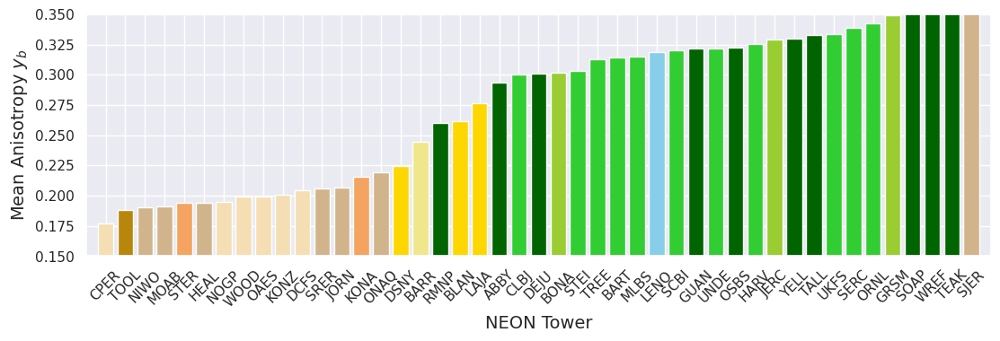

In [259]:
# ------------------------------------ #
# Figure 9 (Original) Slopes Bar Graph #
# ------------------------------------ #
from matplotlib.patches import Patch

dom_color=[]
ybs1=[]
nme=[]

plt.figure(figsize=(13,3.5))
ordered_sitelist=[]
flip_ybs={}
for k in ybs.keys():
    flip_ybs[ybs[k]]=k
ybs_list=list(flip_ybs.keys())
ybs_list.sort()
for k in ybs_list:
    ordered_sitelist.append(flip_ybs[k])
#plt.plot([-2,40],[1,1],'--',c='black',alpha=.5)
print(np.unique(site_nlcd_dom))
for site in ordered_sitelist:
    dom_color.append(class_colors[site_nlcd_dom[site]])
    ybs1.append(ybs[site])
    nme.append(str(site)[2:-1])

bar1 = plt.bar(nme,ybs1,color=dom_color)
#plt.ylim(.93,1.6)
plt.xticks(rotation=45)
#plt.xlim(-1,39)
i=0
#for rect in bar1:
#    height = rect.get_height()
#    plt.text(rect.get_x() + rect.get_width()/2.0, height,str(int(round(errs[i]*100))), ha='center', va='bottom',color='r')
#    i=i+1

#print(site_nlcd_dom.values())
#plt.title('Best Fit Slope by Site with Landcover Type with Error')
#plt.ylabel('Best Fit Slope')
legend_elements=[]
keep_nlcds=[41,42,43,52,71,81,82,90]
for x in keep_nlcds:
    legend_elements.append(Patch(facecolor=class_colors[x], edgecolor='k',label=class_names[x]))
#plt.legend(title='Dominant Landcover',handles=legend_elements)
plt.ylim(.15,.35)
plt.xlim(-1,45)
plt.xlabel('NEON Tower',fontsize=14)
plt.ylabel('Mean Anisotropy $y_b$',fontsize=14)
plt.show()

In [ ]:
import matplotlib as mpl

IndexError: boolean index did not match indexed array along dimension 0; dimension is 3187 but corresponding boolean dimension is 3959

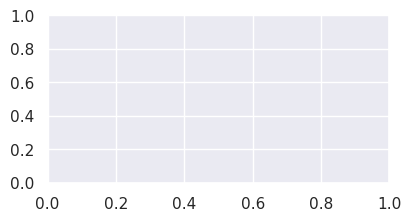

In [253]:
fig=plt.figure(figsize=(15,10))
i=0
for site in ordered_sitelist:
    if i==11:
        ax=plt.subplot(4,3,i+1)
        cmap = mpl.cm.turbo_r
        norm = mpl.colors.Normalize(vmin=0, vmax=np.sqrt(3)/2)
        fig.colorbar(mpl.cm.ScalarMappable(norm=norm, cmap=cmap),
             cax=ax, orientation='horizontal', label='Some Units')
        i=0
        fig=plt.figure(figsize=(15,10))
    plt.subplot(4,3,i+1)
    m = (fpsites[:]==site)
    zl=fp['ZL'][:]
    ybnorm=np.array(ybs0[site])[zl[m]<0.000001]
    m=m&(zl<0.000001)
    ybnorm=ybnorm/(np.sqrt(3)/2)
    colors=plt.cm.turbo(1-ybnorm)
    un=np.sqrt(fp['UU'][m])/(fp['USTAR'][m]+.00001)
    plt.scatter(-zl[m],un,alpha=.5,s=1,color=colors)
    plt.xscale('log')
    plt.ylim(0,10)
    plt.xlim(10**(-3),10**(1.5))
    plt.title(str(site)[2:-1]+': '+str(fp['tow_height'][m][0]))
    plt.scatter([1],[3],color='k')
    i=i+1
plt.show()

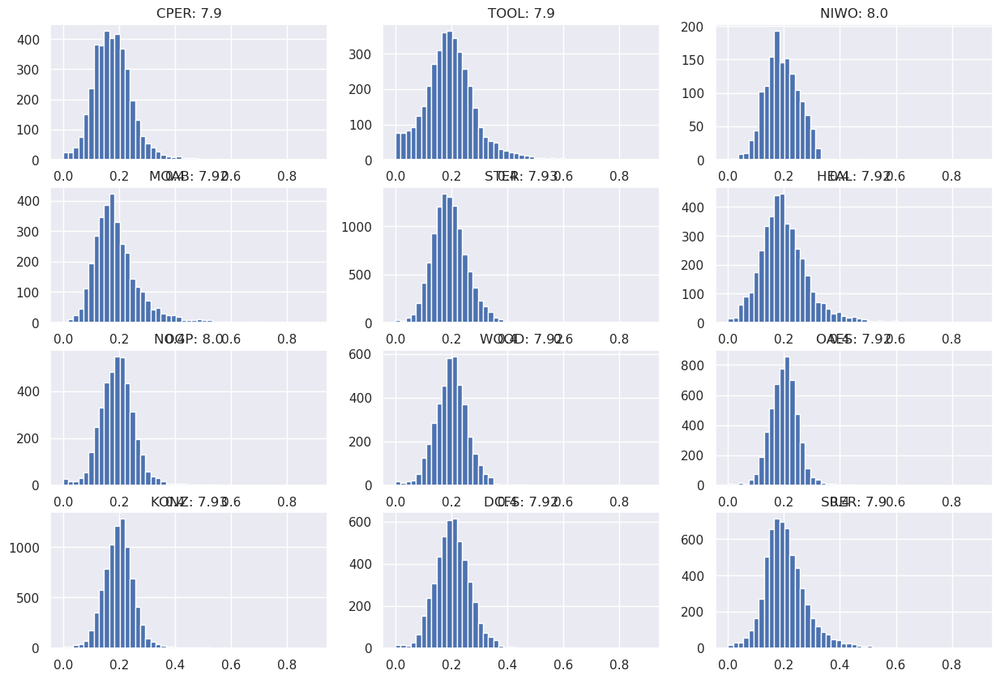

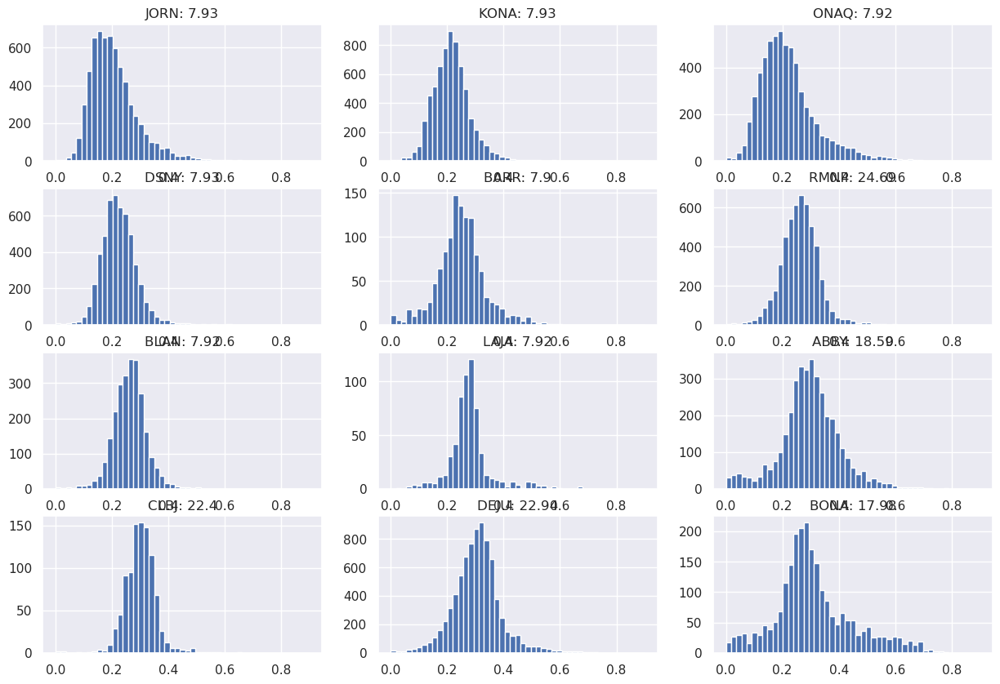

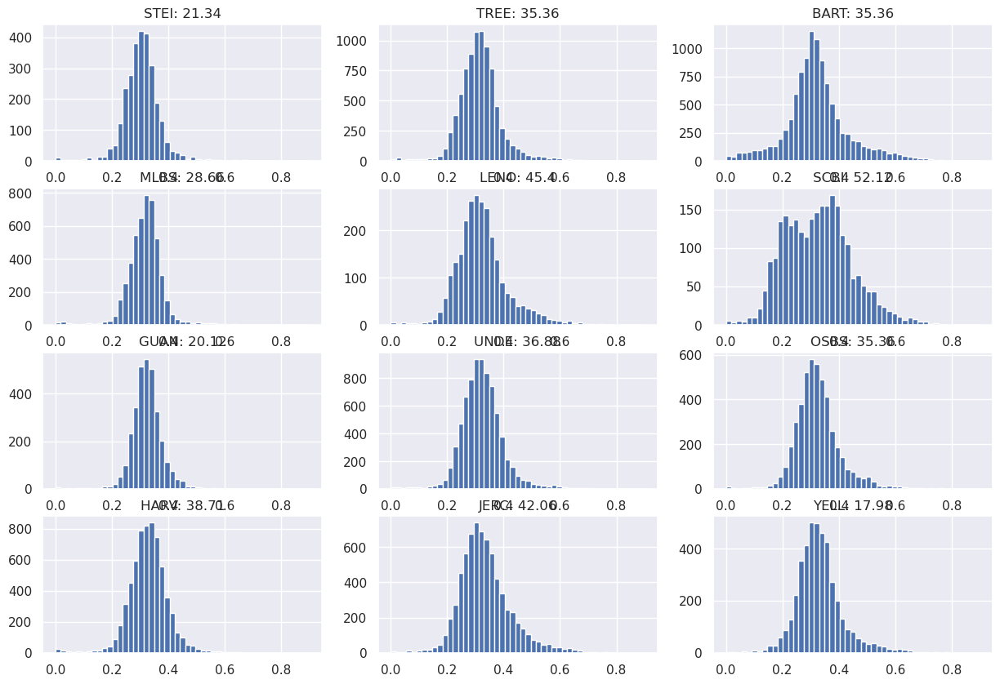

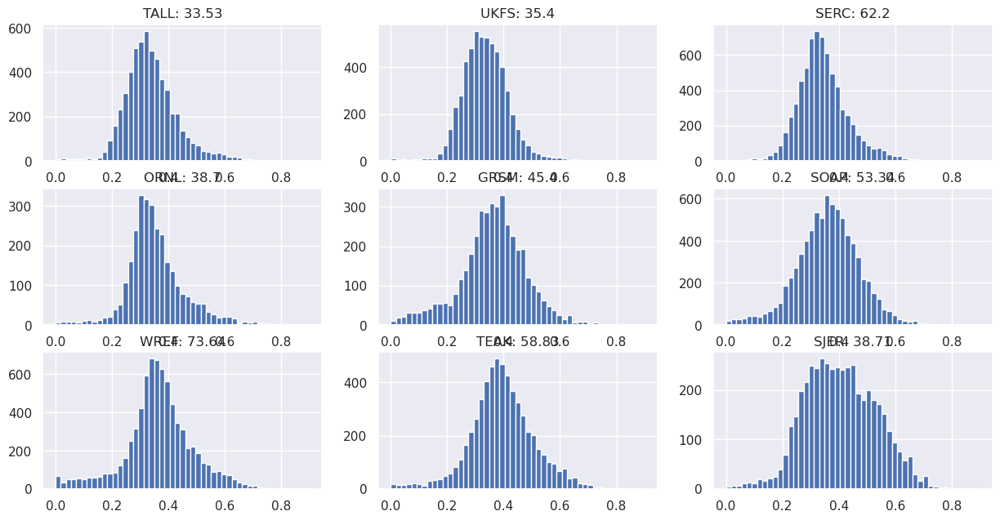

In [14]:
fig=plt.figure(figsize=(15,10))
i=0
for site in ordered_sitelist:
    if i==12:
        i=0
        fig=plt.figure(figsize=(15,10))
    plt.subplot(4,3,i+1)
    m = (fpsites[:]==site)
    zl=fp['ZL'][:]
    ybnorm=np.array(ybs0[site])[zl[m]<0.000001]
    m=m&(zl<0.000001)
    plt.hist(ybnorm,bins=np.linspace(0,.9))
    plt.title(str(site)[2:-1]+': '+str(fp['tow_height'][m][0]))
    i=i+1
plt.show()

In [256]:
m = (fpsites[:]==site)
zl=fp['ZL'][:]
ybnorm=np.array(ybs0[site])[zl[m]<0.000001]
m=m&(zl<0.000001)
ybnorm=ybnorm/(np.sqrt(3)/2)
colors=plt.cm.turbo(1-ybnorm)
un=np.sqrt(fp['UU'][m])/(fp['USTAR'][m]+.00001)
plt.scatter(-zl[m],un,alpha=.5,s=1,color=colors)
plt.xscale('log')
plt.ylim(0,10)
plt.xlim(10**(-3),10**(1.5))
plt.title(str(site)[2:-1]+': '+str(fp['tow_height'][m][0]))
plt.scatter([1],[3],color='k')

IndexError: boolean index did not match indexed array along dimension 0; dimension is 4368 but corresponding boolean dimension is 4729

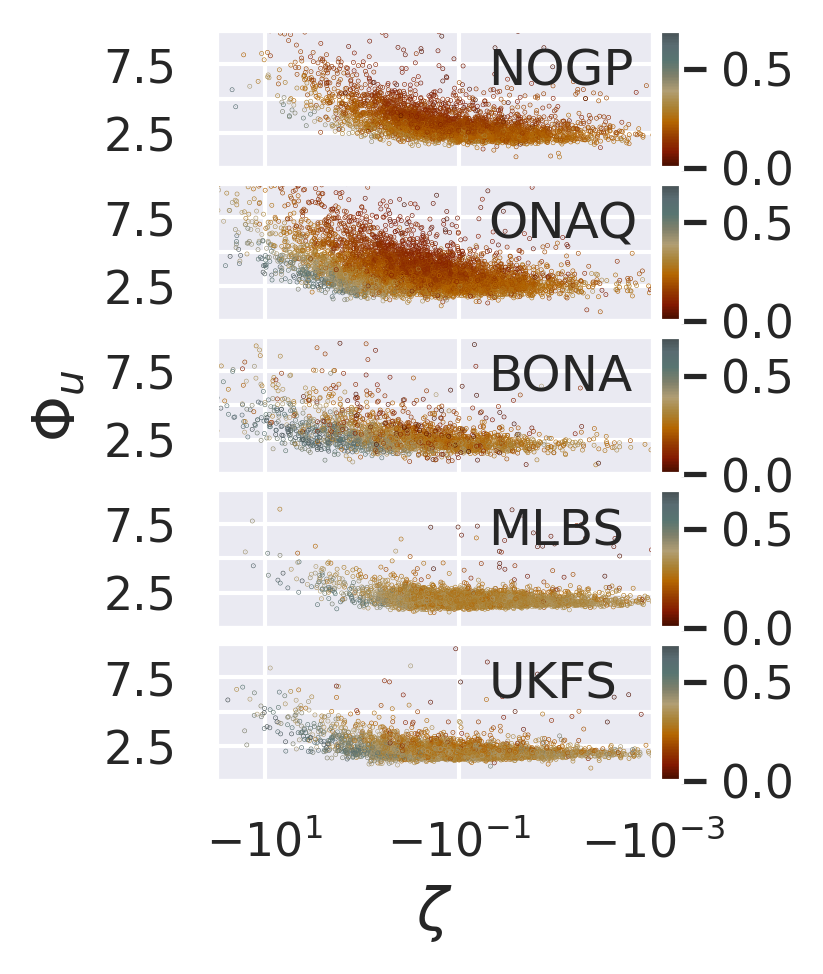

In [264]:
fig=plt.figure(figsize=(2.5*.8,10*.8),dpi=300)
grid=ImageGrid(fig, 111,  # similar to subplot(111)
                 nrows_ncols=(5, 1),
                 axes_pad=0.05,
                 cbar_mode="each",
                 cbar_location='right',
                 cbar_pad=.02,
                 cbar_size="5%")
i=0
#cmap = mpl.cm.turbo_r
norm = mpl.colors.Normalize(vmin=0, vmax=.7)
for site in [b'NOGP',b'ONAQ',b'BONA',b'MLBS',b'UKFS']:
    m = (fpsites[:]==site)
    zl=fp['ZL'][:]
    ybnorm=np.array(ybs0[site])[zl[m]<0.000001]
    m=m&(zl<0.000001)
    ybnorm=ybnorm/(.7)
    colors=cmap(ybnorm)
    un=np.sqrt(fp['UU'][m])/(fp['USTAR'][m]+.00001)
    grid[i].scatter(-zl[m],un,alpha=1,s=0.02,color=colors)
    grid[i].set_xscale('log')
    grid[i].set_ylim(0,10)
    grid[i].set_xlim(10**(-3),10**(1.5))
    grid[i].set_yticks([0,2.5,5,7.5,10],['',2.5,'',7.5,''])
    grid[i].set_xticks([10,.1,.001],[r'$-10^1$',r'$-10^{-1}$',r'$-10^{-3}$'])
    if i ==2:
        grid[i].set_ylabel(r'$\Phi_u$',fontsize=14)
    elif i ==4:
        grid[i].set_xlabel(r'$\zeta$',fontsize=14)
    #grid[i].set_title(str(site)[2:-1])
    grid[i].invert_xaxis()
    grid[i].annotate(str(site)[2:-1],[5*10**(-2),6])
    grid.cbar_axes[i].colorbar(mpl.cm.ScalarMappable(norm=norm, cmap=cmap),)
    
    i=i+1



In [ ]:
norm = mpl.colors.Normalize(vmin=0, vmax=.7)
grid.cbar_axes[i].colorbar(mpl.cm.ScalarMappable(norm=norm, cmap=cmap),)

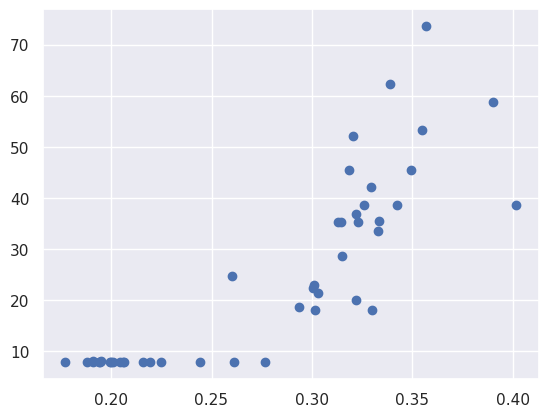

In [235]:
lst_std=[]
for site in sites:
    m = (fpsites[:]==site)
    lst=fp['tow_height'][m]
    lst_std.append(np.nanmean(lst[lst>=0]))
plt.scatter(list(ybs.values()),lst_std)
plt.show()

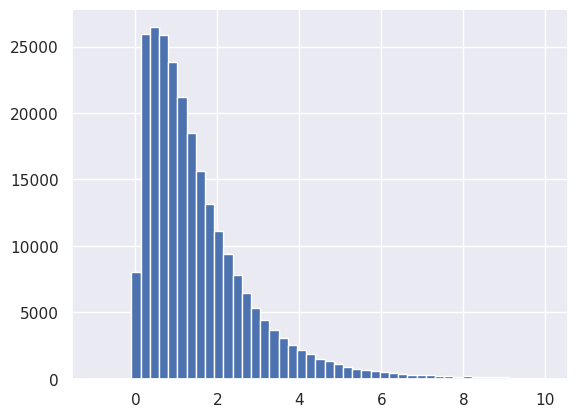

In [169]:
plt.hist(fp['UU'][:],bins=np.linspace(-1,10))
plt.show()

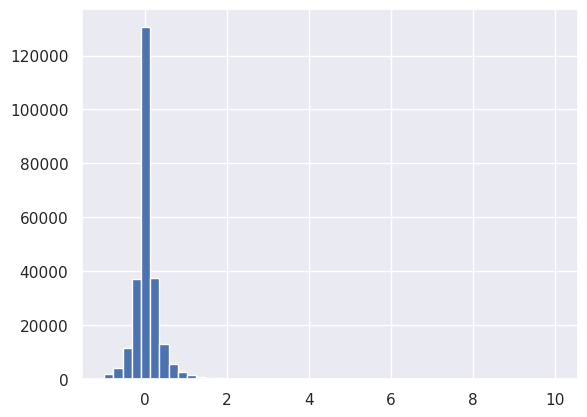

In [174]:
plt.hist(fp['VW'][:],bins=np.linspace(-1,10))
plt.show()

In [187]:
fp.keys()

<KeysViewHDF5 ['CD', 'DAY', 'G', 'H', 'H2O', 'H2O_SIGMA', 'LE', 'LST_0.25_CL10', 'LST_0.25_CL15', 'LST_0.25_CL20', 'LST_0.25_CL5', 'LST_0.25_MEAN', 'LST_0.25_P25', 'LST_0.25_P50', 'LST_0.25_P75', 'LST_0.25_STD', 'LST_0.25_XGRAD', 'LST_0.25_XGRAD_ABS', 'LST_0.25_YGRAD', 'LST_0.25_YGRAD_ABS', 'LST_0.5_CL10', 'LST_0.5_CL15', 'LST_0.5_CL20', 'LST_0.5_CL5', 'LST_0.5_MEAN', 'LST_0.5_P25', 'LST_0.5_P50', 'LST_0.5_P75', 'LST_0.5_STD', 'LST_0.5_XGRAD', 'LST_0.5_XGRAD_ABS', 'LST_0.5_YGRAD', 'LST_0.5_YGRAD_ABS', 'LST_1_CL10', 'LST_1_CL15', 'LST_1_CL20', 'LST_1_CL5', 'LST_1_MEAN', 'LST_1_P25', 'LST_1_P50', 'LST_1_P75', 'LST_1_STD', 'LST_1_XGRAD', 'LST_1_XGRAD_ABS', 'LST_1_YGRAD', 'LST_1_YGRAD_ABS', 'LW_IN', 'LW_OUT', 'NETRAD', 'PA', 'RH', 'RHO', 'SW_IN', 'SW_OUT', 'TA', 'TIME', 'T_SONIC', 'T_SONIC_SIGMA', 'U', 'USTAR', 'UU', 'UV', 'UW', 'V', 'VPD', 'VPT', 'VV', 'VW', 'WS', 'WW', 'ZL', 'canopy_height', 'elevation', 'lat', 'lon', 'nlcd11', 'nlcd12', 'nlcd21', 'nlcd22', 'nlcd23', 'nlcd24', 'nlcd31', 

In [251]:
##############################
###### GET BLH FOR SITES #####
##############################
import os
fig=plt.figure(figsize=(15,10))
blh={}
for site in os.listdir('/home/tsw35/soteria/data/eddy_v2/old'):
    f1=h5py.File('/home/tsw35/soteria/data/eddy_v2/old/'+site,'r')
    blh[site[0:4]]=f1['BLH'][:]
    f1.close()

In [274]:
i=0
fig=plt.figure(figsize=(15,10))
bhms=[]
for site in ordered_sitelist:
    if i==12:
        i=0
        fig=plt.figure(figsize=(15,10))
    plt.subplot(4,3,i+1)
    bh=blh[str(site)[2:-1]]
    bh2=[]
    for j in range(int(len(bh)/48)-1):
        bh2.append(np.nanpercentile(bh[j*48:(j+1)*48],97))
    plt.hist(bh2,bins=np.linspace(250,5000))
    bhms.append(np.mean(bh2))
    plt.title(str(site)[2:-1]+': '+str(np.mean(bh2))[0:6])
    plt.xticks([1000,2000,3000,4000,5000],[])
    i=i+1

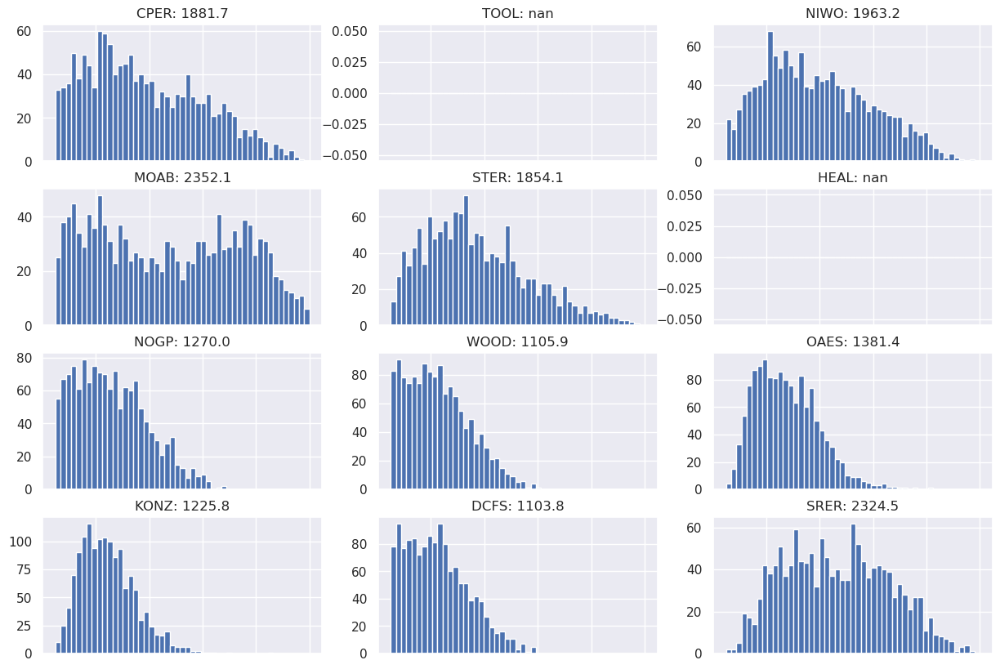

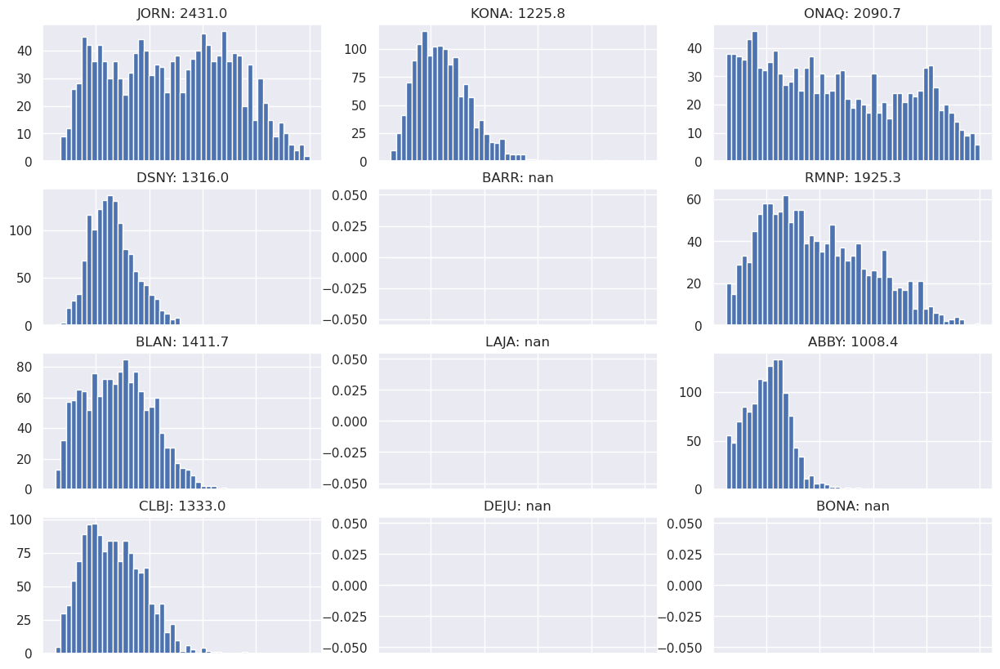

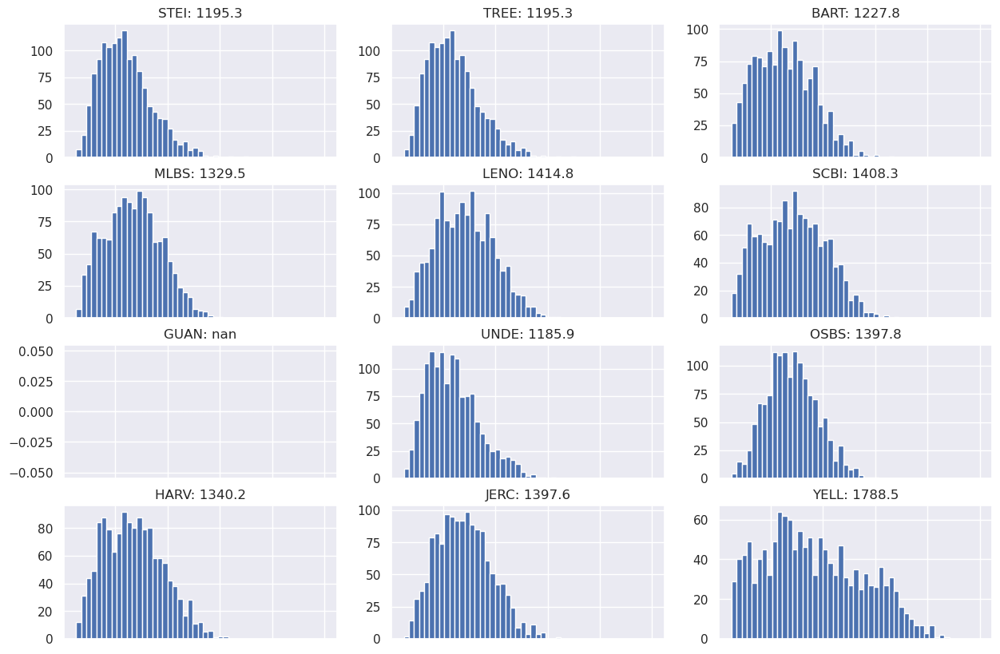

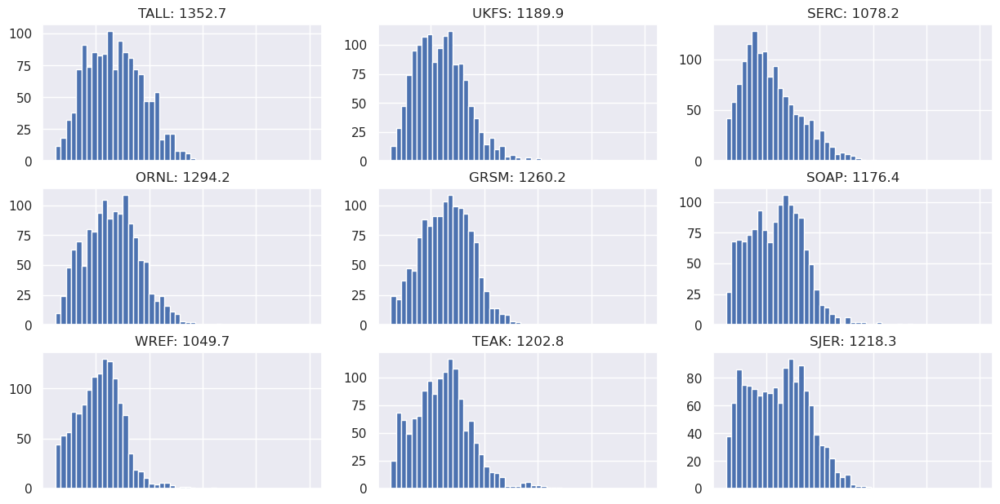

In [275]:
plt.show()

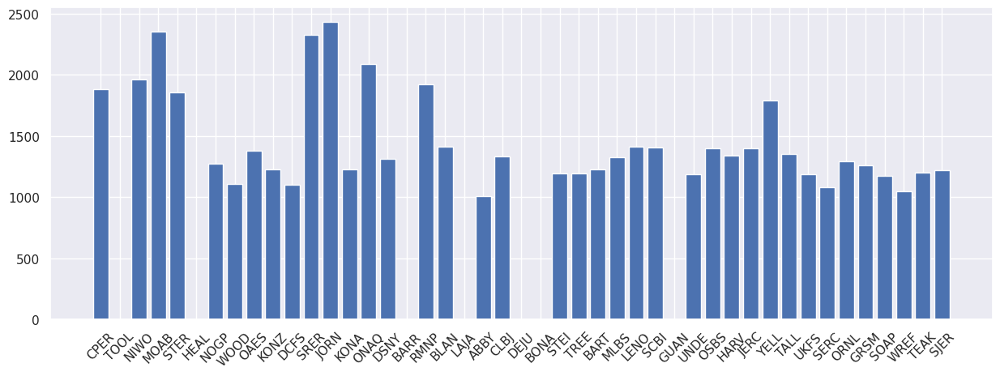

In [282]:
plt.figure(figsize=(15,5))
plt.bar(ordered_sitelist,bhms)
plt.xticks(rotation=45)
plt.show()

In [24]:
fp04=h5py.File('/home/tsw35/soteria/data/NEON/dp04/TEAK/NEON.D17.TEAK.DP4.00200.001.nsae.2020-05.basic.h5','r')
fp0p=h5py.File('/home/tsw35/soteria/data/NEON/raw_data/TEAK/NEON.D17.TEAK.IP0.00200.001.ecte.2020-05-01.l0p.h5','r')

In [10]:
fp0p['TEAK/dp0p/data/'].keys()

<KeysViewHDF5 ['amrs', 'gasRefe', 'irgaTurb', 'mfcSampTurb', 'mfcValiTurb', 'presTrap', 'presValiLineTurb', 'presValiRegInTurb', 'presValiRegOutTurb', 'pumpTurb', 'soni', 'valvLeakHeatTurb', 'valvValiHutTurb', 'valvValiNemaTurb']>

In [104]:
fp04['TEAK/dp01/data/co2Stor/'].keys()

<KeysViewHDF5 ['000_010_02m', '000_010_30m', '000_020_02m', '000_020_30m', '000_030_02m', '000_030_30m', '000_040_02m', '000_040_30m', '000_050_02m', '000_050_30m', '000_060_02m', '000_060_30m', '000_070_02m', '000_070_30m', 'co2Arch_02m', 'co2Arch_30m', 'co2High_02m', 'co2High_30m', 'co2Low_02m', 'co2Low_30m', 'co2Med_02m', 'co2Med_30m', 'co2Zero_02m', 'co2Zero_30m']>

In [99]:
fp04['TEAK/dp01/data/co2Stor/000_050_30m/rtioMoleDryCo2'].dtype

dtype([('mean', '<f8'), ('min', '<f8'), ('max', '<f8'), ('vari', '<f8'), ('numSamp', '<i4'), ('timeBgn', 'S24'), ('timeEnd', 'S24')])

In [3]:
import cartopy

In [4]:
ax= plt.subplot(1,1,1,projection=cartopy.crs.PlateCarree())
ax.background_img('ne_shaded','low')
ax.set_xlim(np.min(nlon)-3,np.max(nlon)+1)
ax.set_ylim(np.min(nlat)-1,np.max(nlat)+1)
ax.add_feature(cartopy.feature.COASTLINE)
#ax.add_feature(cartopy.feature.OCEAN)
ax.add_feature(cartopy.feature.LAND)
ax.add_feature(cartopy.feature.BORDERS)
#ax.add_feature(cartopy.feature.LAKES)
ax.set_aspect('auto')
plt.scatter(nlon,nlat,c='g',s=50,alpha=.5)
#plt.scatter(fnlon,fnlat,marker='*',c='y',s=300)
ax.axis('off')
ax.outline_patch.set_edgecolor('white')
plt.show()
print('hi')


TypeError: draw_wrapper() got an unexpected keyword argument 'inframe'

<Figure size 640x480 with 1 Axes>

hi


In [40]:
igra_lons=[]
igra_lats=[]
igra_name=[]
fp=open('data/igra.txt','r')
for line in fp.readlines():
    year=float(line[77:81])
    if year==2023:
        pass
    else:
        continue
    if 'USM' not in line[0:11]:
        continue
    ln=line[11:31]
    ln=ln.strip()
    igra_lats.append(float(ln.split(' ')[0]))
    igra_lons.append(float(ln.split(' ')[-1]))
    igra_name.append(line[0:11])

In [41]:
for i in range(len(igra_lons)):
    print(igra_name[i]+': '+str(igra_lons[i])+', '+str(igra_lats[i]))

USM00070026: -156.7833, 71.2889
USM00070133: -162.6133, 66.8864
USM00070200: -165.4347, 64.5072
USM00070219: -161.84, 60.785
USM00070231: -155.5978, 62.9583
USM00070261: -147.8767, 64.8161
USM00070273: -149.9864, 61.1567
USM00070308: -170.2167, 57.15
USM00070316: -162.7164, 55.2011
USM00070326: -156.6683, 58.6794
USM00070350: -152.4867, 57.7431
USM00070361: -139.6667, 59.5167
USM00070398: -131.5778, 55.0389
USM00070414: 174.1, 52.7167
USM00072201: -81.7886, 24.5531
USM00072202: -80.3831, 25.7544
USM00072206: -81.7011, 30.4839
USM00072208: -80.0275, 32.895
USM00072210: -82.4006, 27.7053
USM00072214: -84.2994, 30.4461
USM00072215: -84.5672, 33.3558
USM00072221: -86.5167, 30.4833
USM00072230: -86.7822, 33.1789
USM00072233: -89.825, 30.3369
USM00072235: -90.08, 32.3189
USM00072240: -93.2161, 30.1253
USM00072248: -93.8414, 32.4511
USM00072249: -97.2986, 32.835
USM00072250: -97.4192, 25.9167
USM00072251: -97.5056, 27.7789
USM00072261: -100.9183, 29.3744
USM00072265: -102.1892, 31.9425
USM000

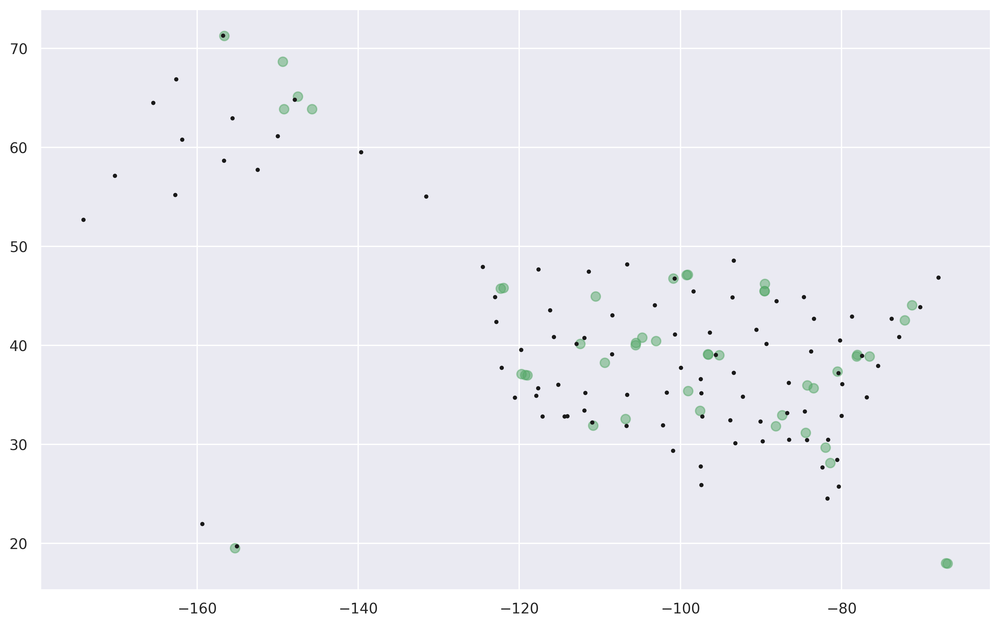

In [47]:
plt.figure(figsize=(13,8),dpi=300)
plt.scatter(nlon,nlat,c='g',s=50,alpha=.5)
plt.scatter(-155.31724,19.55314,c='g',s=50,alpha=.5)
plt.scatter(igra_lons,igra_lats,c='k',s=5)
plt.show()

In [1]:
import rasterio

In [96]:
fp=rasterio.open('/home/tsw35/soteria/data/NEON/chm/_tifs/UKFS_chm.tif')

In [97]:
data=fp.read(1)

In [98]:
fp.xy(0,0)

(-95.26646970055403, 39.09973274835498)

In [99]:
xx,yy=fp.index(nlon[5],nlat[5])

In [100]:
xx,yy=fp.index(nlon[5],nlat[5])
data[data<0]=float('nan')
data2=data[xx-2000:xx+2000,yy-2000:yy+2000]

In [102]:
data2.shape

(4000, 4000)

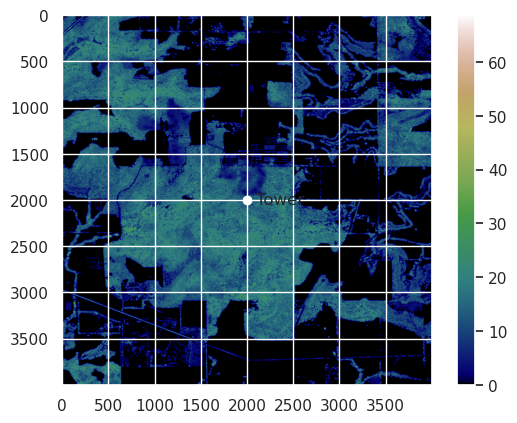

In [103]:
plt.imshow(data2,cmap='gist_earth')
plt.colorbar()
plt.scatter([2000],[2000],color='white')
for i, txt in enumerate(['Tower']):
    plt.annotate(txt, (2100, 2050))  
plt.show()

In [4]:
#####
# TESTING NLCD
#####
from matplotlib import colors

In [84]:
class_names={11:'Water',12:'Snow',21:'Open Dev',22:'Low Dev',23:'Med Dev',24:'High Dev',31:'Barren',\
             41:'Decid.',42:'Everg.',43:'Mix Forest',51:'Dwarf Scrub',52:'Shrub',\
             71:'Grass',72:'AK:Sedge',73:'AK:Lichen',74:'AK:Moss',81:'Pasture',82:'Crops',90:'Wetland',95:'Herb Wet'}
class_colors={11:'royalblue',12:'whitesmoke',21:'pink',22:'lightcoral',23:'red',24:'maroon',31:'silver',\
              41:'limegreen',42:'darkgreen',43:'yellowgreen',51:'darkgoldenrod',52:'tan',\
              71:'wheat',72:'khaki',73:'darkkhaki',74:'darkseagreen',81:'gold',82:'sandybrown',90:'skyblue',95:'cadetblue'}
bounds=[]
clist=[]
names=[]
for i in class_colors.keys():
    bounds.append(i)
    clist.append(class_colors[i])
    names.append(class_names[i])
bounds.append(100)
cmap = colors.ListedColormap(clist)
norm = colors.BoundaryNorm(bounds, cmap.N)

In [ ]:
fig,ax=plt.subplots(figsize=(5,5))
ax.imshow(data,cmap=cmap,norm=norm,interpolation='none')

In [6]:
nlcd='/stor/soteria/hydro/private/nc153/data/NLCD/NLCD_2016_Land_Cover_Science_product_L48_20190424.img'
fpr=rasterio.open(nlcd,'r')

In [25]:
fpr.index(0,0)

(110333, 83101)

In [70]:
gdal_cmd="gdaltransform -s_srs '+proj=longlat +ellps=WGS84 +datum=WGS84 +no_defs' -t_srs '+proj=aea +lat_1=29.5 +lat_2=45.5 +lat_0=23 +lon_0=-96 +x_0=0 +y_0=0 +ellps=WGS84 +towgs84=0,0,0,0,0,0,0 +units=m +no_defs=True' -output_xy < data/in_.txt > data/out_.txt"

In [47]:
from subprocess import run

In [71]:
run(gdal_cmd,shell=True)

CompletedProcess(args="gdaltransform -s_srs '+proj=longlat +ellps=WGS84 +datum=WGS84 +no_defs' -t_srs '+proj=aea +lat_1=29.5 +lat_2=45.5 +lat_0=23 +lon_0=-96 +x_0=0 +y_0=0 +ellps=WGS84 +towgs84=0,0,0,0,0,0,0 +units=m +no_defs=True' -output_xy < data/in_.txt > data/out_.txt", returncode=0)

In [8]:
data_nlcd=fpr.read(1)

In [72]:
towi,towj=fpr.index(69275.689795717,1779736.14652182)

51008

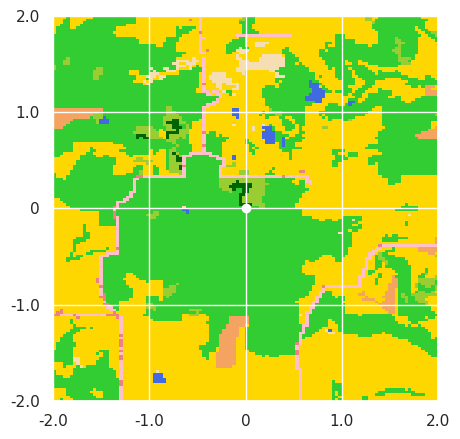

In [117]:
cmap = colors.ListedColormap(clist)
norm = colors.BoundaryNorm(bounds, cmap.N)
fig,ax=plt.subplots(figsize=(5,5))
vw=75
hw=58
ax.imshow(data_nlcd[towi-vw:towi+vw,towj-hw:towj+hw],cmap=cmap,norm=norm,interpolation='none',extent=(-2,2,-2,2))
plt.scatter([0],[0],color='white')
plt.xticks(np.linspace(-2,2,5),[-2.0,-1.0,0,1.0,2.0])
plt.yticks(np.linspace(-2,2,5),[-2.0,-1.0,0,1.0,2.0])
plt.show()

In [250]:
from mpl_toolkits.axes_grid1 import ImageGrid


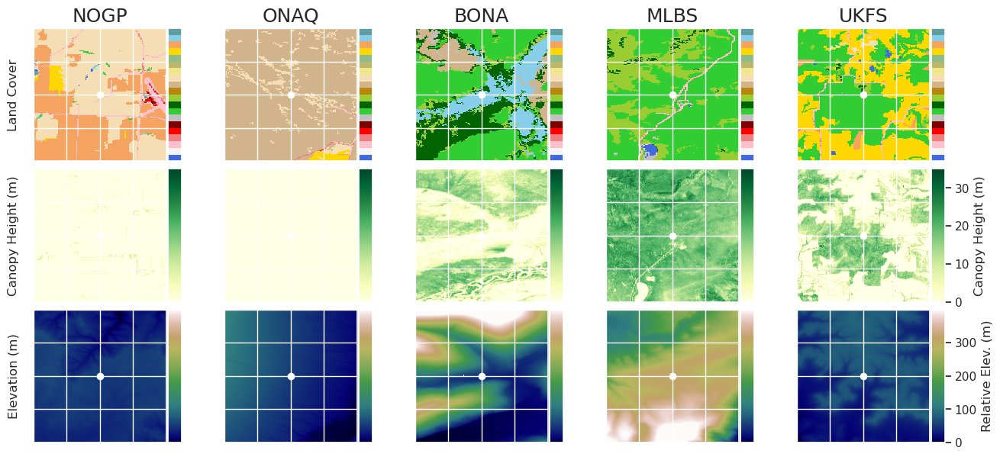

In [218]:
maxh=399


fig=plt.figure(figsize=(2.5*5,9))
subfigs = fig.subfigures(1, 5, hspace=0, wspace=0,frameon=False)
#### NOGP ####
grid=ImageGrid(subfigs[0], 111,  # similar to subplot(111)
                 nrows_ncols=(3, 1),
                 axes_pad=0.1,
                 cbar_mode="each",
                 cbar_location='right',
                 cbar_pad=.02,
                 cbar_size="10%")
towi,towj=fpr.index(-376721.09067976,2651944.55587255)
vw=75
hw=58
im=grid[0].imshow(data_nlcd[towi-vw:towi+vw,towj-hw:towj+hw],cmap=cmap,norm=norm,interpolation='none',extent=(-2,2,-2,2))
grid.cbar_axes[0].colorbar(im,ticks=[])
grid[0].scatter([0],[0],color='white')
grid[0].set_xticks(np.linspace(-2,2,5),[])
grid[0].set_yticks(np.linspace(-2,2,5),[])
grid[0].set_title('NOGP',fontsize=18)
grid[0].set_ylabel('Land Cover')



fp=rasterio.open('/home/tsw35/soteria/data/NEON/chm/_tifs/NOGP_chm.tif')
data=fp.read(1)
xx,yy=fp.index(nlon[7],nlat[7])
data[data<0]=float('nan')
data2=data[xx-2000:xx+2000,yy-2000:yy+2000]
im=grid[1].imshow(data2,cmap='YlGn',extent=(-2,2,-2,2),vmax=35)
grid[1].scatter([0],[0],color='white')
grid[1].set_xticks(np.linspace(-2,2,5),[])
grid[1].set_yticks(np.linspace(-2,2,5),[])
grid[1].set_ylabel('Canopy Height (m)')


fp=rasterio.open('/home/tsw35/soteria/data/NEON/dtm/_tifs/NOGP_dtm.tif')
data=fp.read(1)
xx,yy=fp.index(nlon[7],nlat[7])
data[data<0]=float('nan')
data2=data[xx-2000:xx+2000,yy-2000:yy+2000]
data2=data2-np.min(data2)
im2=grid[2].imshow(data2,cmap='gist_earth',extent=(-2,2,-2,2),vmax=maxh)
grid.cbar_axes[1].colorbar(im,ticks=[])
grid.cbar_axes[2].colorbar(im2,ticks=[])
grid[2].scatter([0],[0],color='white')
grid[2].set_xticks(np.linspace(-2,2,5),[])
grid[2].set_yticks(np.linspace(-2,2,5),[])
grid[2].set_ylabel('Elevation (m)')



#### ONAQ ####
grid=ImageGrid(subfigs[1], 111,  # similar to subplot(111)
                 nrows_ncols=(3, 1),
                 axes_pad=0.1,
                 cbar_mode="each",
                 cbar_location='right',
                 cbar_pad=.02,
                 cbar_size="10%")
towi,towj=fpr.index(-1381875.87445141,2026792.91133654)
vw=75
hw=58
im=grid[0].imshow(data_nlcd[towi-vw:towi+vw,towj-hw:towj+hw],cmap=cmap,norm=norm,interpolation='none',extent=(-2,2,-2,2))
grid.cbar_axes[0].colorbar(im,ticks=[])
grid[0].scatter([0],[0],color='white')
grid[0].set_xticks(np.linspace(-2,2,5),[])
grid[0].set_yticks(np.linspace(-2,2,5),[])
grid[0].set_title('ONAQ',fontsize=18)


fp=rasterio.open('/home/tsw35/soteria/data/NEON/chm/_tifs/ONAQ_chm.tif')
data=fp.read(1)
xx,yy=fp.index(nlon[15],nlat[15])
data[data<0]=float('nan')
data2=data[xx-2000:xx+2000,yy-2000:yy+2000]
im=grid[1].imshow(data2,cmap='YlGn',extent=(-2,2,-2,2),vmax=35)
grid[1].scatter([0],[0],color='white')
grid[1].set_xticks(np.linspace(-2,2,5),[])
grid[1].set_yticks(np.linspace(-2,2,5),[])


fp=rasterio.open('/home/tsw35/soteria/data/NEON/dtm/_tifs/ONAQ_dtm.tif')
data=fp.read(1)
xx,yy=fp.index(nlon[15],nlat[15])
data[data<0]=float('nan')
data2=data[xx-2000:xx+2000,yy-2000:yy+2000]
data2=data2-np.min(data2)
im2=grid[2].imshow(data2,cmap='gist_earth',extent=(-2,2,-2,2),vmax=maxh)
grid.cbar_axes[1].colorbar(im,ticks=[])
grid.cbar_axes[2].colorbar(im2,ticks=[])
grid[2].scatter([0],[0],color='white')
grid[2].set_xticks(np.linspace(-2,2,5),[])
grid[2].set_yticks(np.linspace(-2,2,5),[])





#### BONA ####
grid=ImageGrid(subfigs[2], 111,  # similar to subplot(111)
                 nrows_ncols=(3, 1),
                 axes_pad=0.1,
                 cbar_mode="each",
                 cbar_location='right',
                 cbar_pad=.02,
                 cbar_size="10%")
towi=int(67844/2-11355)
towj=int(124236/2+22450-12)
vw=75
hw=58
im=grid[0].imshow(dataAK[towi-vw:towi+vw,towj-hw:towj+hw],cmap=cmap,norm=norm,interpolation='none',extent=(-2,2,-2,2))
grid.cbar_axes[0].colorbar(im,ticks=[])
grid[0].scatter([0],[0],color='white')
grid[0].set_xticks(np.linspace(-2,2,5),[])
grid[0].set_yticks(np.linspace(-2,2,5),[])
grid[0].set_title('BONA',fontsize=18)


fp=rasterio.open('/home/tsw35/soteria/data/NEON/chm/_tifs/BONA_chm.tif')
data=fp.read(1)
xx,yy=fp.index(nlon[10],nlat[10])
data[data<0]=float('nan')
data2=data[xx-2000:xx+2000,yy-2000:yy+2000]
im=grid[1].imshow(data2,cmap='YlGn',extent=(-2,2,-2,2),vmax=35)
grid.cbar_axes[1].colorbar(im,label='Hello')
grid[1].scatter([0],[0],color='white')
grid[1].set_xticks(np.linspace(-2,2,5),[])
grid[1].set_yticks(np.linspace(-2,2,5),[])


fp=rasterio.open('/home/tsw35/soteria/data/NEON/dtm/_tifs/BONA_dtm.tif')
data=fp.read(1)
xx,yy=fp.index(nlon[10],nlat[10])
data[data<0]=float('nan')
data2=data[xx-2000:xx+2000,yy-2000:yy+2000]
data2=data2-np.nanmin(data2)
im2=grid[2].imshow(data2,cmap='gist_earth',extent=(-2,2,-2,2),vmax=maxh)
grid.cbar_axes[1].colorbar(im,ticks=[])
grid.cbar_axes[2].colorbar(im2,ticks=[])
grid[2].scatter([0],[0],color='white')
grid[2].set_xticks(np.linspace(-2,2,5),[])
grid[2].set_yticks(np.linspace(-2,2,5),[])





#### MLBS ####
grid=ImageGrid(subfigs[3], 111,  # similar to subplot(111)
                 nrows_ncols=(3, 1),
                 axes_pad=0.1,
                 cbar_mode="each",
                 cbar_location='right',
                 cbar_pad=.02,
                 cbar_size="10%")
towi,towj=fpr.index(1351405.12357651,1703423.11999617)
vw=79
hw=46
im=grid[0].imshow(data_nlcd[towi-vw:towi+vw,towj-hw:towj+hw],cmap=cmap,norm=norm,interpolation='none',extent=(-2,2,-2,2))
grid.cbar_axes[0].colorbar(im,ticks=[])
grid[0].scatter([0],[0],color='white')
grid[0].set_xticks(np.linspace(-2,2,5),[])
grid[0].set_yticks(np.linspace(-2,2,5),[])
grid[0].set_title('MLBS',fontsize=18)


fp=rasterio.open('/home/tsw35/soteria/data/NEON/chm/_tifs/MLBS_chm.tif')
data=fp.read(1)
xx,yy=fp.index(nlon[28],nlat[28])
data[data<0]=float('nan')
data2=data[xx-2000:xx+2000,yy-2000:yy+2000]
im=grid[1].imshow(data2,cmap='YlGn',extent=(-2,2,-2,2),vmax=35)
grid[1].scatter([0],[0],color='white')
grid[1].set_xticks(np.linspace(-2,2,5),[])
grid[1].set_yticks(np.linspace(-2,2,5),[])


fp=rasterio.open('/home/tsw35/soteria/data/NEON/dtm/_tifs/MLBS_dtm.tif')
data=fp.read(1)
xx,yy=fp.index(nlon[28],nlat[28])
data[data<0]=float('nan')
data2=data[xx-2000:xx+2000,yy-2000:yy+2000]
data2=data2-np.min(data2)
im2=grid[2].imshow(data2,cmap='gist_earth',extent=(-2,2,-2,2),vmax=maxh)
grid.cbar_axes[1].colorbar(im,ticks=[])
grid.cbar_axes[2].colorbar(im2,ticks=[])
grid[2].scatter([0],[0],color='white')
grid[2].set_xticks(np.linspace(-2,2,5),[])
grid[2].set_yticks(np.linspace(-2,2,5),[])






#### UKFS ####
grid=ImageGrid(subfigs[4], 111,  # similar to subplot(111)
                 nrows_ncols=(3, 1),
                 axes_pad=0.1,
                 cbar_mode="each",
                 cbar_location='right',
                 cbar_pad=.02,
                 cbar_size="10%")
towi,towj=fpr.index(69275.689795717,1779736.14652182)
vw=75
hw=58
im=grid[0].imshow(data_nlcd[towi-vw:towi+vw,towj-hw:towj+hw],cmap=cmap,norm=norm,interpolation='none',extent=(-2,2,-2,2))
grid.cbar_axes[0].colorbar(im,ticks=[])
grid[0].scatter([0],[0],color='white')
grid[0].set_xticks(np.linspace(-2,2,5),[])
grid[0].set_yticks(np.linspace(-2,2,5),[])
grid[0].set_title('UKFS',fontsize=18)


fp=rasterio.open('/home/tsw35/soteria/data/NEON/chm/_tifs/UKFS_chm.tif')
data=fp.read(1)
xx,yy=fp.index(nlon[5],nlat[5])
data[data<0]=float('nan')
data2=data[xx-2000:xx+2000,yy-2000:yy+2000]
im=grid[1].imshow(data2,cmap='YlGn',extent=(-2,2,-2,2),vmax=35)
grid[1].scatter([0],[0],color='white')
grid[1].set_xticks(np.linspace(-2,2,5),[])
grid[1].set_yticks(np.linspace(-2,2,5),[])


fp=rasterio.open('/home/tsw35/soteria/data/NEON/dtm/_tifs/UKFS_dtm.tif')
data=fp.read(1)
xx,yy=fp.index(nlon[5],nlat[5])
data[data<0]=float('nan')
data2=data[xx-2000:xx+2000,yy-2000:yy+2000]
data2=data2-np.min(data2)
im2=grid[2].imshow(data2,cmap='gist_earth',extent=(-2,2,-2,2),vmax=maxh)
grid.cbar_axes[1].colorbar(im,label='Canopy Height (m)')
grid.cbar_axes[2].colorbar(im2,label='Relative Elev. (m)')
grid[2].scatter([0],[0],color='white')
grid[2].set_xticks(np.linspace(-2,2,5),[])
grid[2].set_yticks(np.linspace(-2,2,5),[])

plt.show()

In [161]:
grid.cbar_axes[0].cla()

In [147]:
grid.cbar_axes[0].colorbar(im,shrink=0)

In [17]:
sites

[b'UNDE',
 b'RMNP',
 b'JORN',
 b'WREF',
 b'DCFS',
 b'UKFS',
 b'STER',
 b'NOGP',
 b'TEAK',
 b'GUAN',
 b'BONA',
 b'KONZ',
 b'DSNY',
 b'CPER',
 b'KONA',
 b'ONAQ',
 b'BARR',
 b'MOAB',
 b'GRSM',
 b'YELL',
 b'HARV',
 b'STEI',
 b'HEAL',
 b'ABBY',
 b'SCBI',
 b'TREE',
 b'WOOD',
 b'OSBS',
 b'MLBS',
 b'BART',
 b'NIWO',
 b'SOAP',
 b'TALL',
 b'BLAN',
 b'DEJU',
 b'ORNL',
 b'SJER',
 b'SERC',
 b'SRER',
 b'CLBJ',
 b'TOOL',
 b'JERC',
 b'LENO',
 b'OAES',
 b'LAJA']

In [163]:
np.where(np.array(sites)==b'ONAQ')

(array([15]),)

In [36]:
print([nlat[28],nlon[28]])

[37.3783056, -80.5248361]


-95.19215

In [165]:
fpAK=rasterio.open('/home/tsw35/xSot_shared/alaska_nlcd/NLCD_2016_Land_Cover_AK_20200724.img','r')

In [167]:
dataAK=fpAK.read(1)

In [169]:
dataAK.shape

(67844, 124236)

([<matplotlib.axis.YTick at 0x7fcb2453e950>,
 [Text(0, -2.0, ''),
  Text(0, -1.0, ''),
  Text(0, 0.0, ''),
  Text(0, 1.0, ''),
  Text(0, 2.0, '')])

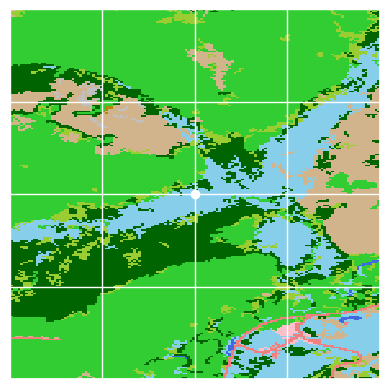

In [205]:
towi=int(67844/2-11355)
towj=int(124236/2+22450-12)
vw=120
hw=72
plt.imshow(dataAK[towi-vw:towi+vw,towj-hw:towj+hw],cmap=cmap,norm=norm,interpolation='none',extent=(-2,2,-2,2))
plt.scatter([0],[0],color='white')
plt.xticks(np.linspace(-2,2,5),[])
plt.yticks(np.linspace(-2,2,5),[])

(0.0, 10.0)

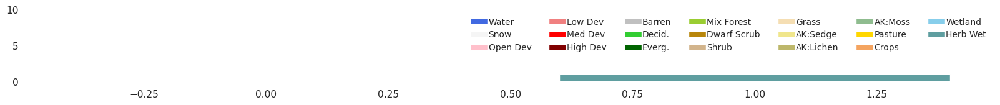

In [256]:
fig=plt.figure(figsize=(20,1.5))
ax = fig.add_subplot(1, 1, 1)
line=[0,1]
for i in clist:
    plt.bar(line,line,color=i)
ax.set_facecolor('white')
plt.legend(names,ncol=7,handletextpad=.1,fontsize=10,framealpha=0)
plt.grid(False)
plt.ylim(0,10)

(0.0, 10.0)

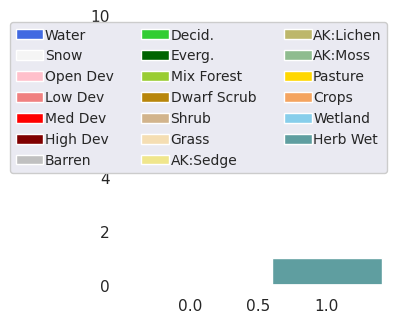

In [257]:
fig=plt.figure(figsize=(3.5,3.5))
ax = fig.add_subplot(1, 1, 1)
line=[0,1]
for i in clist:
    plt.bar(line,line,color=i)
ax.set_facecolor('white')
plt.legend(names,ncol=3,handletextpad=.1,fontsize=10,framealpha=1)
plt.grid(False)
plt.ylim(0,10)

In [302]:
fp.keys()

<KeysViewHDF5 ['CD', 'DAY', 'G', 'H', 'H2O', 'H2O_SIGMA', 'LE', 'LST_0.25_CL10', 'LST_0.25_CL15', 'LST_0.25_CL20', 'LST_0.25_CL5', 'LST_0.25_MEAN', 'LST_0.25_P25', 'LST_0.25_P50', 'LST_0.25_P75', 'LST_0.25_STD', 'LST_0.25_XGRAD', 'LST_0.25_XGRAD_ABS', 'LST_0.25_YGRAD', 'LST_0.25_YGRAD_ABS', 'LST_0.5_CL10', 'LST_0.5_CL15', 'LST_0.5_CL20', 'LST_0.5_CL5', 'LST_0.5_MEAN', 'LST_0.5_P25', 'LST_0.5_P50', 'LST_0.5_P75', 'LST_0.5_STD', 'LST_0.5_XGRAD', 'LST_0.5_XGRAD_ABS', 'LST_0.5_YGRAD', 'LST_0.5_YGRAD_ABS', 'LST_1_CL10', 'LST_1_CL15', 'LST_1_CL20', 'LST_1_CL5', 'LST_1_MEAN', 'LST_1_P25', 'LST_1_P50', 'LST_1_P75', 'LST_1_STD', 'LST_1_XGRAD', 'LST_1_XGRAD_ABS', 'LST_1_YGRAD', 'LST_1_YGRAD_ABS', 'LW_IN', 'LW_OUT', 'NETRAD', 'PA', 'RH', 'RHO', 'SW_IN', 'SW_OUT', 'TA', 'TIME', 'T_SONIC', 'T_SONIC_SIGMA', 'U', 'USTAR', 'UU', 'UV', 'UW', 'V', 'VPD', 'VPT', 'VV', 'VW', 'WS', 'WW', 'ZL', 'canopy_height', 'elevation', 'lat', 'lon', 'nlcd11', 'nlcd12', 'nlcd21', 'nlcd22', 'nlcd23', 'nlcd24', 'nlcd31', 

In [15]:
fp4=h5py.File('/home/tsw35/soteria/data/NEON/dp04/UKFS/NEON.D06.UKFS.DP4.00200.001.nsae.2021-09.basic.h5','r')


In [195]:
fp4['UKFS/dp01/data/soni/000_060_30m/veloYaxsErth']['mean']

array([-1.68197928, -1.78255929, -2.1366897 , ...,  1.2942029 ,
        2.92417718,  3.79036092])

In [93]:
fp4['UKFS/dp04/data/foot'].keys()

In [98]:
fp4['UKFS/dp04/data/foot/stat'].attrs.keys()

<KeysViewHDF5 ['sysCordRefe']>

In [83]:
fp4['UKFS/dp04/data/foot/stat'][:]

array([(b'2021-09-01T00:00:00.000Z', b'2021-09-01T00:29:59.950Z',  42.92587311, 20., 0.51973781, 0.43471441, 0.26466773, 24.77, 2.477     , 1000., 340., 140., 100.),
       (b'2021-09-01T00:30:00.000Z', b'2021-09-01T00:59:59.950Z',  42.91512564, 20., 0.49648087, 0.44530121, 0.24674655, 24.77, 2.477     , 1000., 320., 140.,  80.),
       (b'2021-09-01T01:00:00.000Z', b'2021-09-01T01:29:59.950Z',  42.08319883, 20., 0.55539025, 0.48421895, 0.2854544 , 24.77, 2.23789591, 1000., 340., 160.,  80.),
       ...,
       (b'2021-09-30T22:30:00.000Z', b'2021-09-30T22:59:59.950Z', 202.53717556, 20., 0.48317598, 0.23      , 0.2       , 24.77, 0.27766265, 1000., 780., 320., 120.),
       (b'2021-09-30T23:00:00.000Z', b'2021-09-30T23:29:59.950Z', 170.47629814, 20., 2.13345167, 0.72351545, 0.41156542, 24.77, 2.477     , 1000., 320., 140., 200.),
       (b'2021-09-30T23:30:00.000Z', b'2021-09-30T23:59:59.950Z', 164.24773752, 20., 1.02511228, 0.49843972, 0.34873753, 24.77, 2.477     , 1000., 380., 160.,

In [49]:
height=np.array(fp4['UKFS'].attrs['DistZaxsLvlMeasTow'][:],dtype='float')

In [50]:
nn=len(fp4['UKFS/dp01/data/tempAirLvl/000_040_30m/temp']['mean'][:])

In [51]:
Tp=np.zeros((nn,len(height)))
for i in range(len(height)):
    if i==(len(height)-1):
        Tp[:,i]=fp4['UKFS/dp01/data/tempAirTop/000_0'+str(i+1)+'0_30m/temp']['mean'][:]
    else:
        Tp[:,i]=fp4['UKFS/dp01/data/tempAirLvl/000_0'+str(i+1)+'0_30m/temp']['mean'][:]

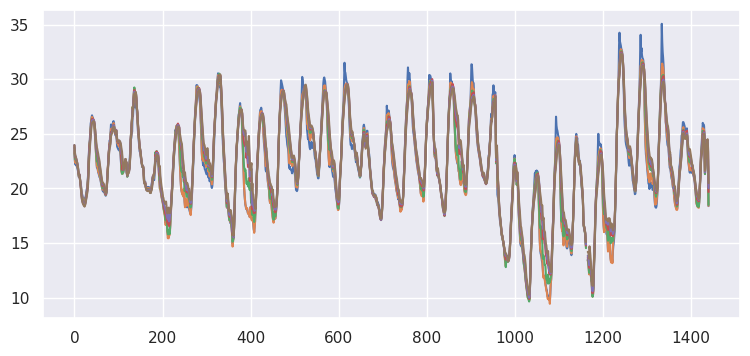

In [57]:
plt.figure(figsize=(9,4))
plt.plot(Tp[:,0])
plt.plot(Tp[:,1])
plt.plot(Tp[:,2])
plt.plot(Tp[:,3])
plt.plot(Tp[:,4])
plt.plot(Tp[:,5])

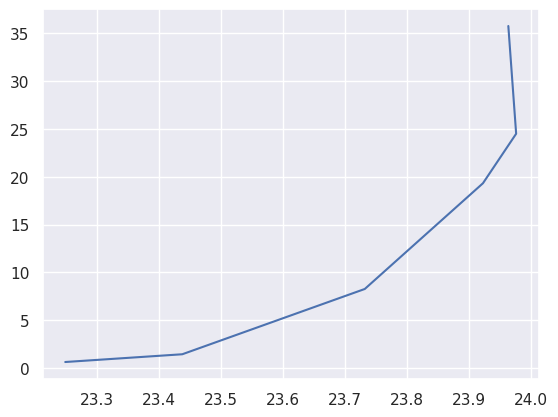

In [61]:
plt.plot(Tp[0,:],height)

In [40]:
from scipy import optimize

(array([ 78.,  94., 104., 123., 103.,  91.,  79.,  62.,  41., 248.]),
 array([1.000000e-05, 2.477090e-01, 4.954080e-01, 7.431070e-01,
        9.908060e-01, 1.238505e+00, 1.486204e+00, 1.733903e+00,
        1.981602e+00, 2.229301e+00, 2.477000e+00]),
 <BarContainer object of 10 artists>)

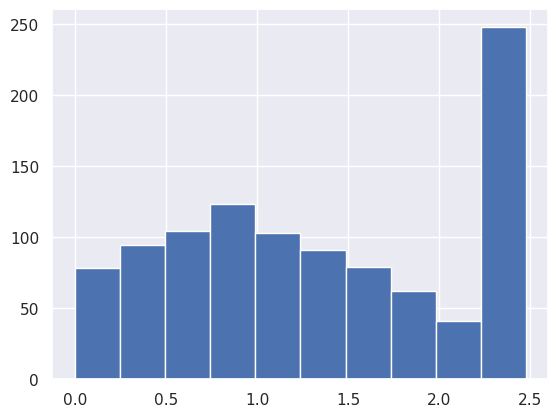

In [94]:
plt.hist(z0s[qf==0])

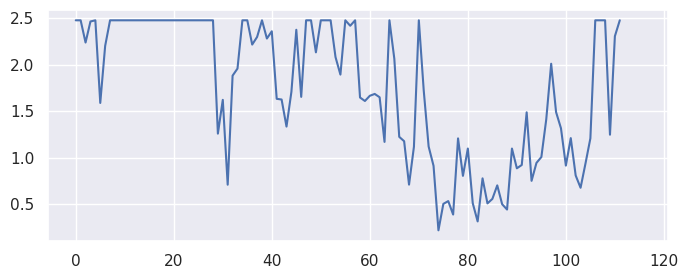

In [87]:
plt.figure(figsize=(8,3))
plt.plot(z0s[0:120])

In [136]:
z0=np.nanmedian(z0s[z0s<2.4])
z0

0.9857195649902164

In [137]:
def interspline(z_,b,c,d):
    a=-d*np.log(z0)
    uz=a+b*z_+c*z_**2+d*np.log(z_)
    return uz

In [138]:
def interspline2(z_,b,c):
    a=-c*np.log(z0)
    uz=a+b*z_+c*np.log(z_)
    return uz

In [149]:
def interspline3(z_,a,b,c):
    uz=a+b*z_+c*np.log(z_)
    return uz

In [115]:
bcd,out=optimize.curve_fit(interspline,height,Tp[0,:])

array([  6.4827274 ,  -0.11568226, -19.61162116])

In [112]:
Tp[0,:]

array([23.24841223, 23.43709635, 23.73138892, 23.92192806, 23.97544578,
       23.96282938])

In [170]:
dtdz=np.zeros((nn,))
for i in range(nn):
    try:
        bcd,out=optimize.curve_fit(interspline3,height,Tp[i,:])
    except:
        continue
    zs=np.linspace(height[-1]-.5,height[-1]+.5,11)
    
    Us=interspline3(zs,bcd[0],bcd[1],bcd[2])
    dudz[i]=np.gradient(Us,zs)[5]

In [157]:
bcd

array([22.38138697,  0.03434125,  0.15677485])

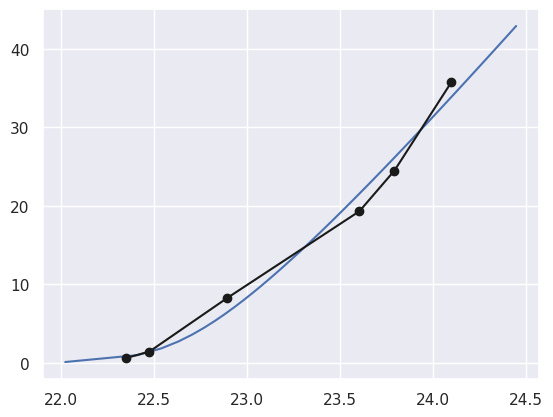

In [158]:
plt.plot(Us,zs)
plt.plot(Tp[50,:],height,'k-o')

In [118]:
np.gradient(Tp[0,:],height)

array([ 0.23294336,  0.21281474,  0.03321528,  0.01253124,  0.00672574,
       -0.00111947])

In [133]:
np.log(1)

0.0

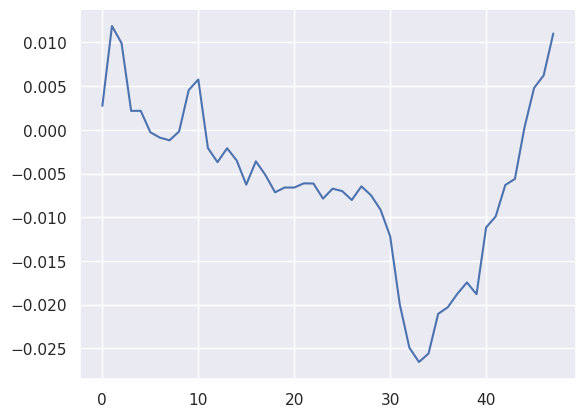

In [172]:
plt.plot(dudz[0:48])

In [160]:
zs.extend(5)

AttributeError: 'numpy.ndarray' object has no attribute 'extend'

In [211]:
dudz=fp2['DUDZ'][:]
dtdz=fp2['DTDZ'][:]

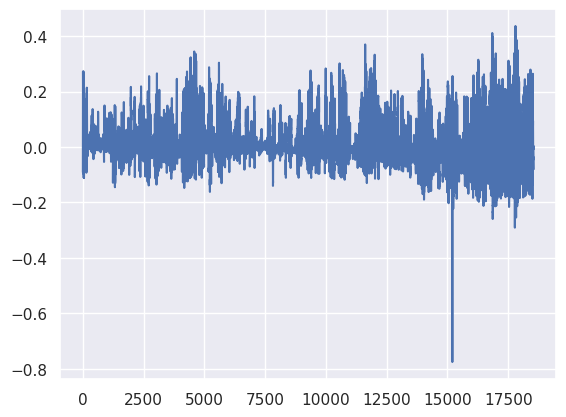

In [212]:
plt.plot(dtdz[dtdz>-9999])

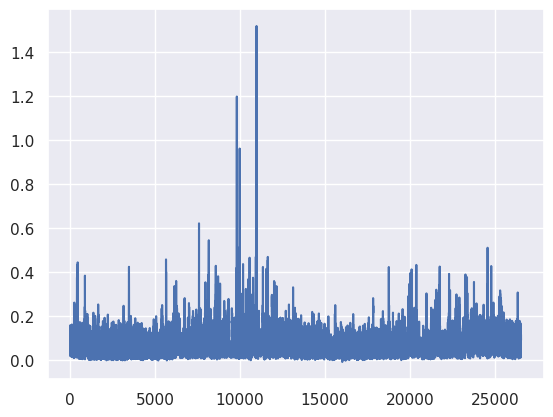

In [214]:
plt.plot(dudz[dudz>-9999])

In [209]:
fp2.close()

In [202]:
fp2

<Closed HDF5 file>

In [206]:
testu=fp2['vertical_wind/WIND_4.81'][:]

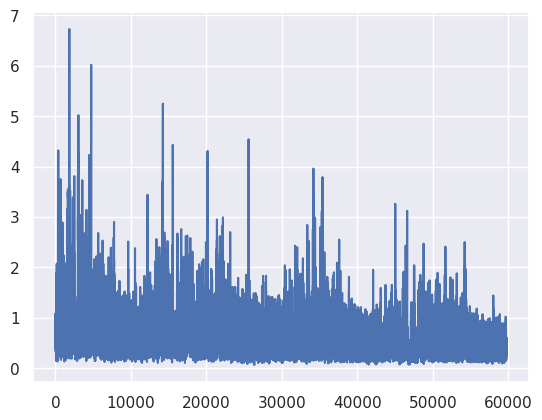

In [208]:
plt.plot(testu[testu>-9999])

In [269]:
fp2.close()
fp4.close()
fp.close()

In [270]:
fptest=h5py.File('/home/tsw35/soteria/data/eddy_v2/old/YELL_L2.h5','r')

In [271]:
dtdz=fptest['DTDZ'][:]

(array([   67.,  6311., 16634.,  3401.,   833.,   115.,    60.,    64.,
           17.,    28.]),
 array([-0.17797676, -0.09801506, -0.01805336,  0.06190834,  0.14187004,
         0.22183174,  0.30179344,  0.38175514,  0.46171683,  0.54167853,
         0.62164023]),
 <BarContainer object of 10 artists>)

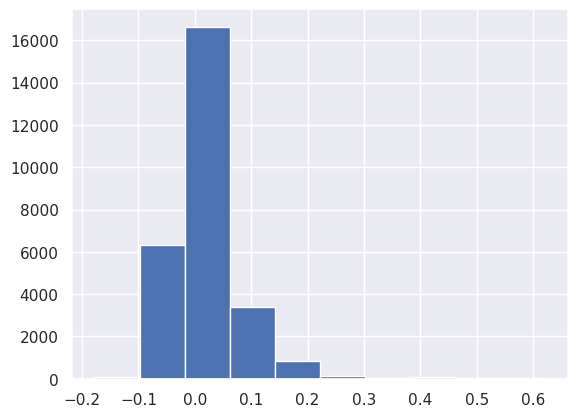

In [273]:
plt.hist(dtdz[dtdz>-8888])

In [2]:
#fp=h5py.File('/home/tsw35/soteria/neon_advanced/data/QAQCv4_2_neon_pntEB0.25_frez_DT_DU_H2_T__US_UU_UV_UW_VV_VW_WW_ZL.h5','r')# Sites
fp=h5py.File('/home/tsw35/soteria/neon_advanced/data/QAQCv4_2_neon_dayEB1_frez_DT_DU_H2_T__US_UU_UV_UW_VV_VW_WW_ZL.h5','r')# Sites
focus_sites=[b'WREF',b'NOGP',b'BART',b'SOAP','MAP',b'ORNL',b'SRER',b'KONZ',b'DSNY']
#focus_sites=[b'ABBY',b'SCBI',b'HARV',b'JERC','MAP',b'ORNL',b'TREE',b'OSBS',b'UNDE']
fpsites=fp['site'][:]
lats=fp['lat'][:]
lons=fp['lon'][:]
sites = []
nlat=[]
nlon=[]
fnlat=[]
fnlon=[]
for i in range(len(fpsites)):
    x=fpsites[i]
    if x not in sites:
        nlat.append(lats[i])
        nlon.append(lons[i])
        sites.append(x)
        if x in focus_sites:
            fnlat.append(lats[i])
            fnlon.append(lons[i])

In [3]:
phim=.4*fp['tow_height'][:]/fp['USTAR'][:]*fp['DUDZ'][:]
rho=fp['RHO'][:]
H=fp['H'][:]/1005/rho
TSTAR=-H/fp['USTAR'][:]
phih=.4*fp['tow_height'][:]/TSTAR*fp['DTDZ'][:]

In [346]:
np.mean(rho)

1.1132262628903031

In [7]:
uu=fp['UU'][:]
btij=aniso(fp['UU'][:],fp['VV'][:],fp['WW'][:],fp['UV'][:],fp['UW'][:],fp['VW'][:])
y_b=np.zeros((len(uu),))
for i in range(len(uu)):
    lam3=np.min(np.linalg.eig(btij[i,:,:])[0])
    y_b[i]=np.sqrt(3)/2*(3*lam3+1)

In [8]:
zl=fp['ZL'][:]
m=(zl<0.000001)

0.15
[nan, 157.95437340621814, 31.404043283039307, 11.2862024567098, 4.456182688924218, 2.6138383061142987, 1.2038320382968546, 0.7007582278955611, 0.46212695716363683, 0.31420082407906547, 0.24616373628229948, 0.17490029403280438, 0.13267944583280789, 0.07087774529636884]

0.25
[122.48639538684193, 54.63830963629032, 22.50484048027505, 6.901167454950451, 2.947432908111991, 1.4274964245516248, 0.9795939648898069, 0.7497275348118537, 0.5317775073814222, 0.3737963758100397, 0.23113843013993055, 0.1725288877682693, 0.13404926669840828, 0.09279521644534006]

0.35
[101.7444422126357, 53.64361892082477, 39.478520079395125, 18.99358178011527, 7.585999483134644, 3.8352855803893093, 2.545333825682701, 1.9109955861783636, 1.3200016317669898, 0.8350010816165763, 0.45990898360411536, 0.2490528217469144, 0.1708218577106776, 0.13058816551387495]

0.45
[354.63648983660204, 264.833790897343, 105.28453274228119, 32.73593702076627, 15.873271404663384, 6.8597840298753425, 4.060487433771912, 2.72743361602

Text(0, 0.5, '$\\Phi_h$')

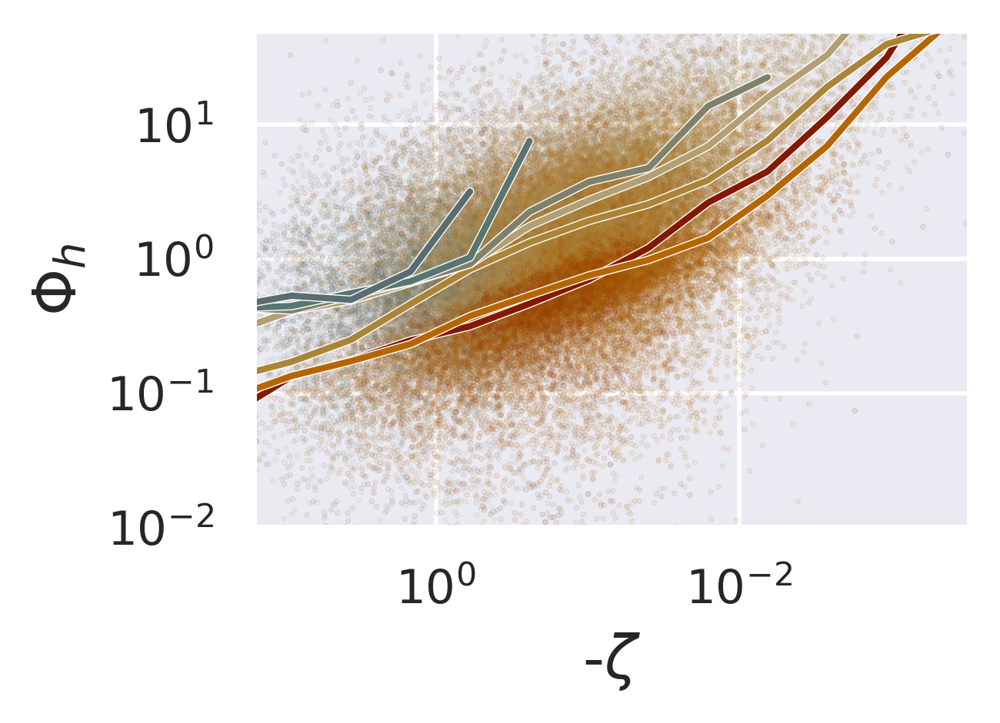

In [63]:
binlist=[.05,.15,.25,.35,.45,.55,.65,.75]
import matplotlib.patheffects as pe
plt.figure(figsize=(5*.6,3.5*.6),dpi=400)

m=(zl<0.000001)&(phih>=0)
ybnorm=np.array(y_b)[m]
ybnorm=ybnorm/(.7)
colors=cmap(ybnorm)
un=phih[m]
plt.scatter(-zl[m],un,alpha=.15,s=.1,color=colors,label=None)
plt.xscale('log')
plt.yscale('log')



colors = plt.cm.turbo(np.linspace(1,0,len(binlist)))
#colors =["#410d00","#831901","#983e00","#b56601","#ab8437",
#             "#b29f74","#7f816b","#587571","#596c72"]

colors = ["#410d00","#831901","#b56601","#ab8437",
             "#b29f74","#7f816b","#587571","#596c72"]
for i in range(1,len(binlist)):
    ir=binlist[i]
    m2=(y_b[m]<ir)&(y_b[m]>(ir-.1))
    un=phih[m][m2]
    zlp=-zl[m][m2]
    #plt.semilogx(zlp,un,'.',alpha=.2,ms=2,color=colors[i])
    zlbins=np.logspace(-4,1.5,15)
    zlout=[]
    unout=[]
    for j in range(1,15):
        zlout.append((zlbins[j]+zlbins[j-1])/2)
        m3=(zlp>zlbins[j-1])&(zlp<zlbins[j])
        if np.sum(m3)<=5:
            unout.append(float('nan'))
        else:
            unout.append(np.median(un[m3]))
    print(binlist[i])
    print(unout)
    print()
    #plt.loglog(zlout,unout,'-',alpha=.75,color=colors[i])
    plt.plot(zlout,unout,'-',alpha=1,color=colors[i],path_effects=[pe.Stroke(linewidth=2, foreground='w'), pe.Normal()],label=str(round(ir-.05,1)))
    plt.xscale('log')
    plt.yscale('log')
    
#plt.legend(loc='upper right',title=r'$y_b$',ncol=2,handlelength=1)
plt.ylim(10**(-2),5*10**1)
plt.xlim(3*10**(-4),10**(1.2))
#plt.xticks([10,1,.1,.01,.001],[r'$-10^1$',r'$-10^0$',r'$-10^{-1}$',r'$-10^{-2}$',r'$-10^{-3}$'])
plt.gca().invert_xaxis()
plt.xlabel(r'-$\zeta$',fontsize=14)
plt.ylabel(r'$\Phi_h$',fontsize=14)


0.15
[nan, nan, nan, 0.8290058174743163, 1.1459614231617152, 0.7688065347839788, 0.6067169807801464, 0.5023127022774111, 0.4636994905779529, 0.7582453749651932, 2.529248107450021, 4.440010305346763, 5.736483518858628, 28.421864371614838]

0.25
[0.3615096488255618, 0.7351639410212994, 0.86122539533582, 0.9367595617364783, 0.8819561525549168, 0.8711838292115627, 0.8402812304445406, 0.7490439928395538, 0.5898834466731407, 0.5598935218564851, 1.33378215956078, 2.774371700414634, 3.1923018703375505, 7.0901293846532365]

0.35
[1.1307485733579703, 1.2294819999738102, 1.2728449295167326, 1.329264247009293, 1.1484676003048764, 1.2605834794233939, 1.3161483912197882, 1.3643808769570729, 1.1149833269630154, 0.9247819120941736, 0.9223972207621253, 1.3682305961555625, 2.5402304600312613, 4.957174187292827]

0.45
[nan, 2.1398703042993388, 1.7765248262951392, 1.639387862574897, 1.6886401437648084, 1.6282463737329838, 1.6756461544384162, 1.7046441443370295, 1.467673794880995, 1.1147960683201452, 1.220

Text(0, 0.5, '$\\Phi_m$')

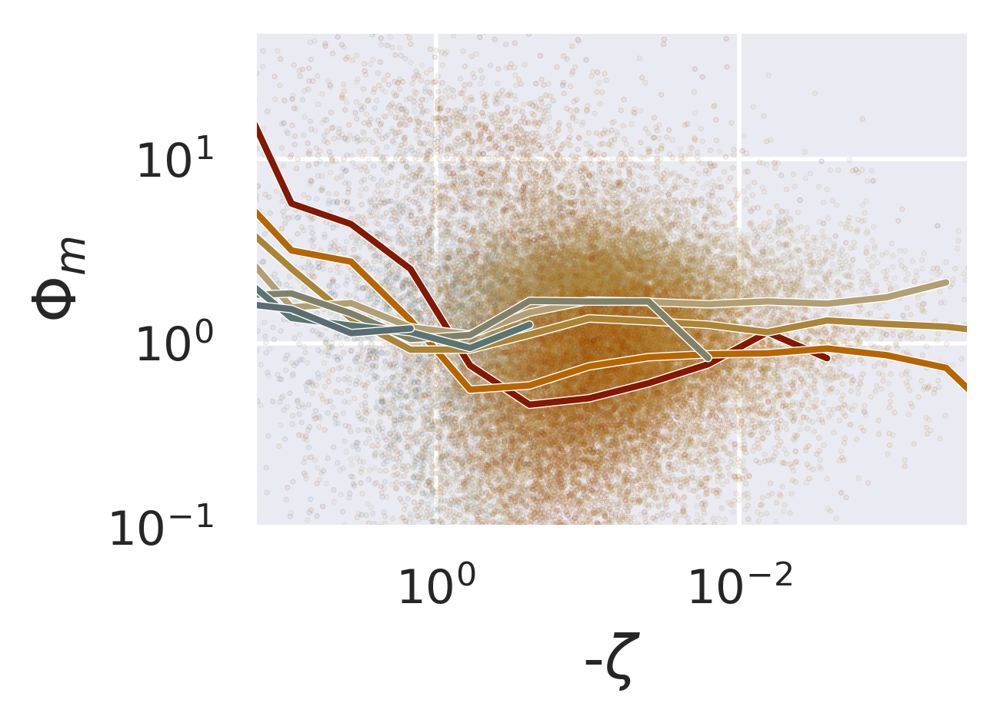

In [354]:
binlist=[.05,.15,.25,.35,.45,.55,.65,.75]
import matplotlib.patheffects as pe
plt.figure(figsize=(5*.6,3.5*.6),dpi=400)

m=(zl<0.000001)&(phim>=0)
ybnorm=np.array(y_b)[m]
ybnorm=ybnorm/(.7)
colors=cmap(ybnorm)
un=phim[m]
plt.scatter(-zl[m],un,alpha=.15,s=.1,color=colors,label=None)
plt.xscale('log')
plt.yscale('log')



colors = plt.cm.turbo(np.linspace(1,0,len(binlist)))
#colors =["#410d00","#831901","#983e00","#b56601","#ab8437",
#             "#b29f74","#7f816b","#587571","#596c72"]

colors = ["#410d00","#831901","#b56601","#ab8437",
             "#b29f74","#7f816b","#587571","#596c72"]
for i in range(1,len(binlist)):
    ir=binlist[i]
    m2=(y_b[m]<ir)&(y_b[m]>(ir-.1))
    un=phim[m][m2]
    zlp=-zl[m][m2]
    #plt.semilogx(zlp,un,'.',alpha=.2,ms=2,color=colors[i])
    zlbins=np.logspace(-4,1.5,15)
    zlout=[]
    unout=[]
    for j in range(1,15):
        zlout.append((zlbins[j]+zlbins[j-1])/2)
        m3=(zlp>zlbins[j-1])&(zlp<zlbins[j])
        if np.sum(m3)<=5:
            unout.append(float('nan'))
        else:
            unout.append(np.median(un[m3]))
    print(binlist[i])
    print(unout)
    print()
    #plt.loglog(zlout,unout,'-',alpha=.75,color=colors[i])
    plt.plot(zlout,unout,'-',alpha=1,color=colors[i],path_effects=[pe.Stroke(linewidth=2, foreground='w'), pe.Normal()],label=str(round(ir-.05,1)))
    plt.xscale('log')
    plt.yscale('log')
    
#plt.legend(loc='upper right',title=r'$y_b$',ncol=2,handlelength=1)
plt.ylim(10**(-1),5*10**1)
plt.xlim(3*10**(-4),10**(1.2))
#plt.xticks([10,1,.1,.01,.001],[r'$-10^1$',r'$-10^0$',r'$-10^{-1}$',r'$-10^{-2}$',r'$-10^{-3}$'])
plt.gca().invert_xaxis()
plt.xlabel(r'-$\zeta$',fontsize=14)
plt.ylabel(r'$\Phi_m$',fontsize=14)

Text(0, 0.5, '$\\Phi_h$')

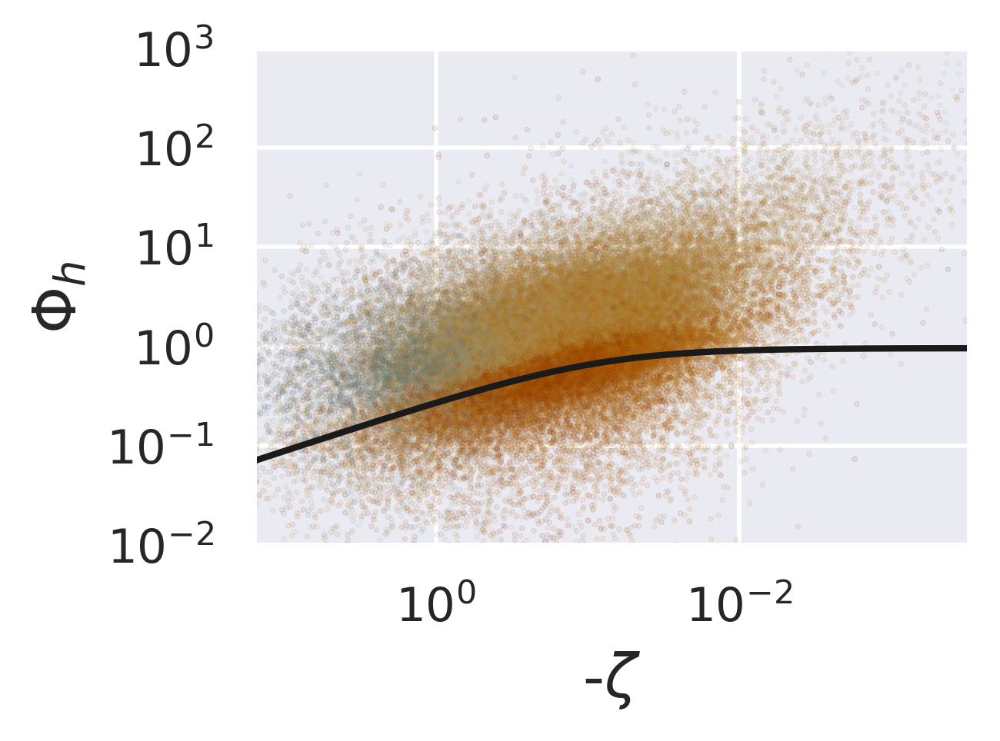

In [355]:
binlist=[.05,.15,.25,.35,.45,.55,.65,.75]
import matplotlib.patheffects as pe
plt.figure(figsize=(5*.6,3.5*.6),dpi=400)

m=(zl<0.000001)&(phih>=0)
ybnorm=np.array(y_b)[m]
ybnorm=ybnorm/(.7)
colors=cmap(ybnorm)
un=phih[m]
plt.scatter(-zl[m],un,alpha=.15,s=.1,color=colors,label=None)
plt.xscale('log')
plt.yscale('log')

zlfake=-np.logspace(-4,1.5,50)
MOSTphih=.96*(1-11.6*zlfake)**(-1/2)
plt.plot(-zlfake,MOSTphih,'k')
    
#plt.legend(loc='upper right',title=r'$y_b$',ncol=2,handlelength=1)
plt.ylim(10**(-2),10**3)
plt.xlim(3*10**(-4),10**(1.2))
#plt.xticks([10,1,.1,.01,.001],[r'$-10^1$',r'$-10^0$',r'$-10^{-1}$',r'$-10^{-2}$',r'$-10^{-3}$'])
plt.gca().invert_xaxis()
plt.xlabel(r'-$\zeta$',fontsize=14)
plt.ylabel(r'$\Phi_h$',fontsize=14)

Text(0, 0.5, '$\\Phi_m$')

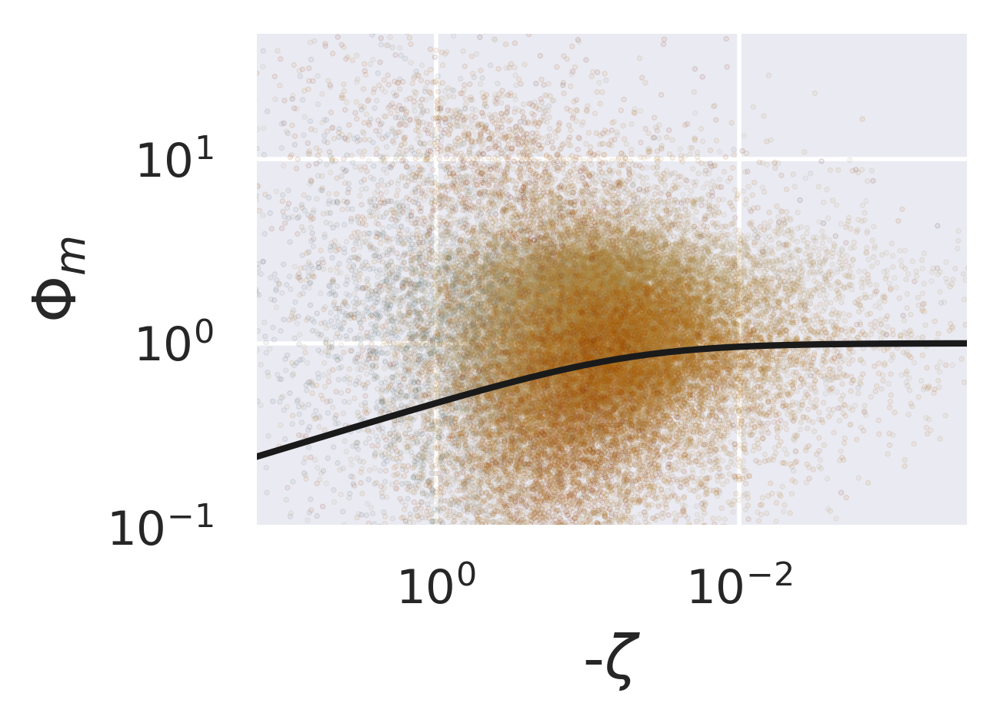

In [356]:
binlist=[.05,.15,.25,.35,.45,.55,.65,.75]
import matplotlib.patheffects as pe
plt.figure(figsize=(5*.6,3.5*.6),dpi=400)

m=(zl<0.000001)&(phim>=0)
ybnorm=np.array(y_b)[m]
ybnorm=ybnorm/(.7)
colors=cmap(ybnorm)
un=phim[m]
plt.scatter(-zl[m],un,alpha=.15,s=.1,color=colors,label=None)
plt.xscale('log')
plt.yscale('log')

zlfake=-np.logspace(-4,1.5,50)
MOSTphim=(1-19*zlfake)**(-1/4)
plt.plot(-zlfake,MOSTphim,'k')

#plt.legend(loc='upper right',title=r'$y_b$',ncol=2,handlelength=1)
plt.ylim(10**(-1),5*10**1)
plt.xlim(3*10**(-4),10**(1.2))
#plt.xticks([10,1,.1,.01,.001],[r'$-10^1$',r'$-10^0$',r'$-10^{-1}$',r'$-10^{-2}$',r'$-10^{-3}$'])
plt.gca().invert_xaxis()
plt.xlabel(r'-$\zeta$',fontsize=14)
plt.ylabel(r'$\Phi_m$',fontsize=14)

(array([ 9., 10., 12., 16.,  6.,  9.,  9., 12.,  8., 14., 12.,  5., 11.,
         9.,  8.,  8., 10.,  7.,  9.,  7.,  7.,  5.,  7.,  5.,  7.,  0.,
         0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.]),
 array([-0.1       , -0.09591837, -0.09183673, -0.0877551 , -0.08367347,
        -0.07959184, -0.0755102 , -0.07142857, -0.06734694, -0.06326531,
        -0.05918367, -0.05510204, -0.05102041, -0.04693878, -0.04285714,
        -0.03877551, -0.03469388, -0.03061224, -0.02653061, -0.02244898,
        -0.01836735, -0.01428571, -0.01020408, -0.00612245, -0.00204082,
         0.00204082,  0.00612245,  0.01020408,  0.01428571,  0.01836735,
         0.02244898,  0.02653061,  0.03061224,  0.03469388,  0.03877551,
         0.04285714,  0.04693878,  0.05102041,  0.05510204,  0.05918367,
         0.06326531,  0.06734694,  0.07142857,  0.0755102 ,  0.07959184,
         0.08367347,  0.0877551 ,  0.09183673,  0.09591837,  0.1

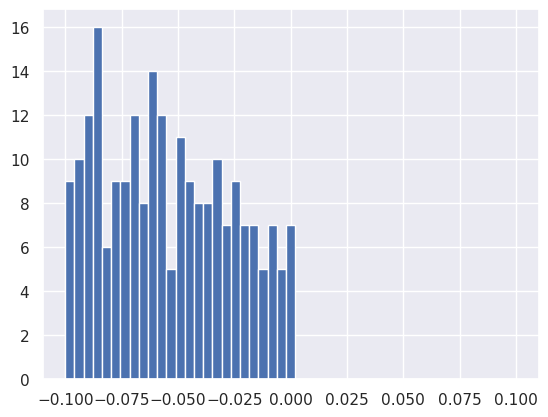

In [298]:
plt.hist(phih,bins=np.linspace(-.1,.1,50))

(array([ 18.,  15.,  19.,  29.,  31.,  39.,  35.,  40.,  47.,  53.,  63.,
         54.,  48.,  63.,  98.,  83., 109., 124., 144., 158., 192., 212.,
        203., 193., 182., 164., 172., 144., 122.,  95., 102.,  81.,  90.,
         80.,  64.,  54.,  49.,  43.,  36.,  39.,  30.,  32.,  28.,  17.,
         19.,  13.,  11.,  10.,   8.]),
 array([-0.2       , -0.19183673, -0.18367347, -0.1755102 , -0.16734694,
        -0.15918367, -0.15102041, -0.14285714, -0.13469388, -0.12653061,
        -0.11836735, -0.11020408, -0.10204082, -0.09387755, -0.08571429,
        -0.07755102, -0.06938776, -0.06122449, -0.05306122, -0.04489796,
        -0.03673469, -0.02857143, -0.02040816, -0.0122449 , -0.00408163,
         0.00408163,  0.0122449 ,  0.02040816,  0.02857143,  0.03673469,
         0.04489796,  0.05306122,  0.06122449,  0.06938776,  0.07755102,
         0.08571429,  0.09387755,  0.10204082,  0.11020408,  0.11836735,
         0.12653061,  0.13469388,  0.14285714,  0.15102041,  0.15918367,
       

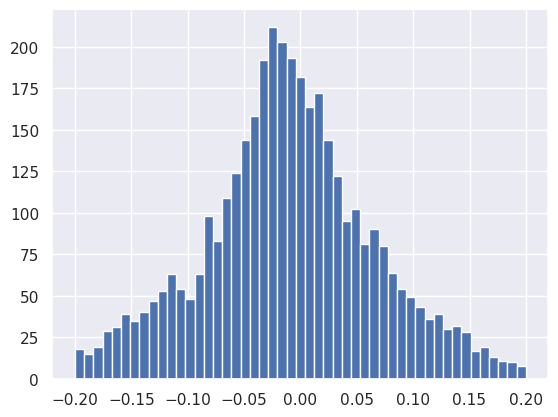

In [281]:
dudz=fp['DUDZ'][:]
dtdz=fp['DTDZ'][:]
plt.hist(dudz[dudz!=0],bins=np.linspace(-.2,.2))

(array([0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
        1.0000e+00, 0.0000e+00, 0.0000e+00, 1.0000e+00, 0.0000e+00,
        0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
        0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 1.0000e+00,
        0.0000e+00, 0.0000e+00, 0.0000e+00, 1.0000e+00, 0.0000e+00,
        2.0000e+00, 0.0000e+00, 4.0000e+00, 2.0000e+00, 3.0000e+00,
        6.0000e+00, 2.0000e+01, 9.8947e+04, 6.6000e+01, 6.0000e+00,
        7.0000e+00, 0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00,
        0.0000e+00, 2.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00,
        1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00]),
 array([-100.        ,  -96.93877551,  -93.87755102,  -90.81632653,
         -87.75510204,  -84.69387755,  -81.63265306,  -78.57142857,
         -75.51020408,  -72.44897959,  -69.3877551 ,  -66.32653061,
         -63.26530612,  -60.20408163,  -57.14285714,  -54.08163265,
         -51.02040816,  -47.95918367,  -44.89795918,  -41.

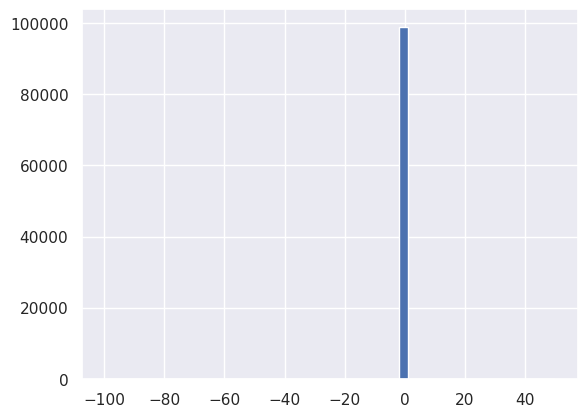

In [330]:
plt.hist(phih,bins=np.linspace(-100,50))

(array([  91., 1103., 3101., 3979.,   83.,    0.,    0.,    0.,    6.,
          20.]),
 array([-3.        , -1.78911537, -0.57823074,  0.63265389,  1.84353852,
         3.05442315,  4.26530778,  5.47619241,  6.68707705,  7.89796168,
         9.10884631]),
 <BarContainer object of 10 artists>)

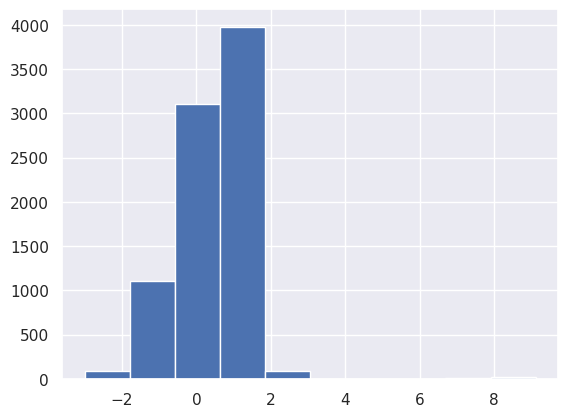

In [314]:
dudz=fp['DUDZ'][:]
plt.hist(dudz[np.abs(dudz)>0])

In [316]:
for site in sites:
    print(str(site)+': '+str(np.mean(fp['DUDZ'][fpsites==site])))

b'UNDE': 0.0
b'RMNP': 0.0
b'JORN': 0.049517241379310344
b'WREF': 0.0
b'DCFS': 0.05770340450086555
b'UKFS': 0.0
b'STER': 0.03526448362720403
b'NOGP': 0.08016194331983806
b'BONA': 0.0
b'KONZ': 0.1258023106546855
b'DSNY': 0.01278772378516624
b'CPER': 0.24646429513057133
b'KONA': 0.03892755864913638
b'GRSM': 0.0
b'HARV': 0.0
b'STEI': 0.0
b'ABBY': 0.0
b'TREE': 0.0
b'WOOD': 0.06107341147439852
b'OSBS': 0.0
b'NIWO': -0.08361092604930047
b'SOAP': 0.0
b'TALL': 0.0
b'BLAN': 0.0013386880856760374
b'ORNL': 0.0
b'SRER': 0.010955710955710955
b'CLBJ': 0.0
b'TOOL': 0.020640569395017794
b'LENO': 0.0
b'OAES': 0.09646302250803858


In [322]:
for site in sites:
    print(str(site)+': '+str(np.sum(fp['DTDZ'][fpsites==site]==0)/np.sum(fpsites==site)*100)[0:6]+'   '+str(np.sum(fpsites==site)))

b'UNDE': 0.0   4113
b'RMNP': 0.0   4201
b'JORN': 0.0   7250
b'WREF': 0.0   2082
b'DCFS': 0.0   1733
b'UKFS': 0.0   1905
b'STER': 0.0   7940
b'NOGP': 0.0   3705
b'BONA': 0.0   2915
b'KONZ': 0.0   3895
b'DSNY': 0.0   782
b'CPER': 0.0   4504
b'KONA': 0.0   3879
b'GRSM': 0.0   789
b'HARV': 0.0   1928
b'STEI': 0.0   2299
b'ABBY': 0.0   3500
b'TREE': 0.0   2067
b'WOOD': 0.0   6484
b'OSBS': 0.0   2652
b'NIWO': 0.0   3002
b'SOAP': 0.0   4941
b'TALL': 0.0   1384
b'BLAN': 0.0   1494
b'ORNL': 0.0   5944
b'SRER': 0.0   4290
b'CLBJ': 0.0   541
b'TOOL': 0.0   1405
b'LENO': 0.0   4069
b'OAES': 0.0   3421


In [283]:
fpa=h5py.File('/home/tsw35/soteria/data/eddy_v2/lst/ABBY_L2.h5','r')

In [284]:
dudz=fpa['DUDZ'][:]
dtdz=fpa['DTDZ'][:]

In [285]:
print(len(dudz))
print(len(dudz[dudz>-9999]))
print(len(dudz[(dudz>-9999)&(np.abs(dudz)>0)]))

96336
30817
42


In [289]:
fpa.close()

In [286]:
m7=(dudz>-9999)&(np.abs(dudz)>0)
dudz[m7]

array([ 1, -1, -1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1, -1, -1, -1,
       -1, -1,  1,  1,  1,  3,  1,  1,  1,  1,  1,  1,  1,  2,  1,  2,  2,
        1,  1,  1,  1,  1,  1,  1,  1])

In [6]:
fpa['vertical_wind'].keys()

<KeysViewHDF5 ['WIND_0.59', 'WIND_13.07', 'WIND_4.81', 'WIND_9.78']>

In [7]:
wind=np.zeros((5,96336))

In [8]:
wind[0,:]=fpa['vertical_wind/WIND_0.59'][:]
wind[1,:]=fpa['vertical_wind/WIND_4.81'][:]
wind[2,:]=fpa['vertical_wind/WIND_9.78'][:]
wind[3,:]=fpa['vertical_wind/WIND_13.07'][:]
wind[4,:]=fpa['WS'][:]

In [9]:
m8=(wind[0,:]>-9999)&(wind[1,:]>-9999)&(wind[2,:]>-9999)&(wind[3,:]>-9999)&(wind[4,:]>-9999)

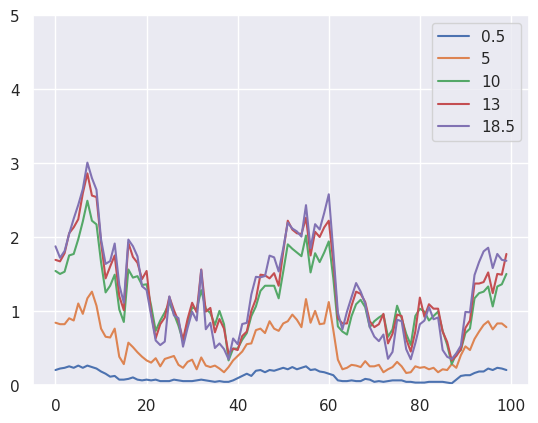

In [20]:
for i in range(5):
    plt.plot(wind[i,m8][10000:10100])
plt.ylim(0,5)
plt.legend(['0.5','5','10','13','18.5'])

In [19]:
fpa.attrs['tow_height']

18.59

In [33]:
prof1=np.mean(wind[:,m8][:,10000:10100],axis=1)

In [86]:
hts=[.59,4.81,9.78,13.07,18.59]

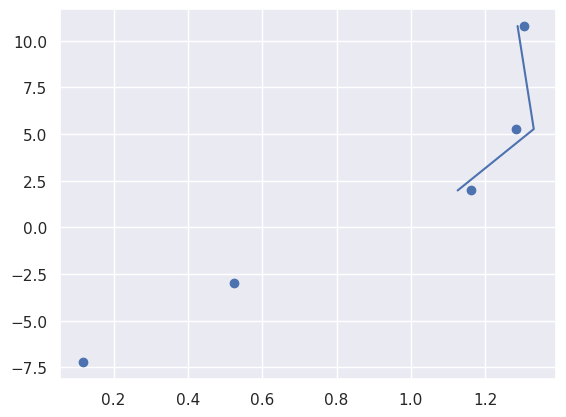

In [80]:
plt.scatter(prof1,hts)
plt.plot(outs,hts[-3:])

In [236]:
z0=.05
zd=float(fpa.attrs['zd'])

In [358]:
def intT(z_,a,b,c):
    return a+b*(z_-zd)+c*np.log(z_-zd)
def intU(z_,b,c):
    a=-c*np.log(z0)
    return a+b*(z_-zd)+c*np.log(z_-zd)

In [200]:
hts=[.59,4.81,9.78,13.07,18.59]
hts=np.array(hts)

In [201]:
bcd,out=optimize.curve_fit(intU,hts[1:],prof1[1:])
zs=np.linspace(zd+.1,hts[-1]+.5,50)#np.linspace(hts[-1]-.5,hts[-1]+.5,11)
outs=intU(zs,bcd[0],bcd[1])
DUDZ=np.gradient(outs,zs)


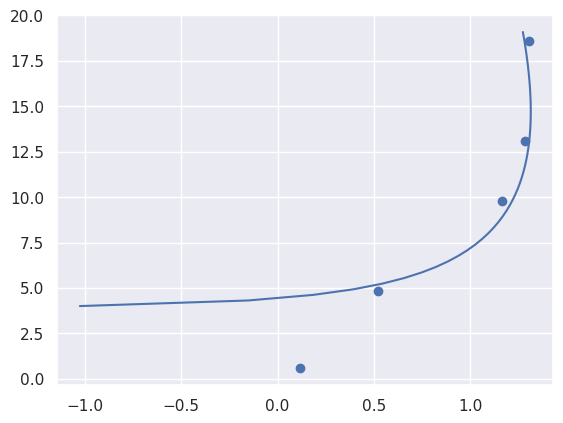

In [202]:
plt.scatter(prof1,hts)
plt.plot(outs,zs)

In [359]:
hts=[.59,4.81,9.78,13.07,18.59]
bcd,out=optimize.curve_fit(intT,hts[1:],prof1[1:])
zs=np.linspace(zd+.1,hts[-1]+.5,50) #np.linspace(hts[-1]-.5,hts[-1]+.5,11)
outs=intT(zs,bcd[0],bcd[1],bcd[2])
DUDZ=np.gradient(outs,zs)

Text(0, 0.5, 'Height (m)')

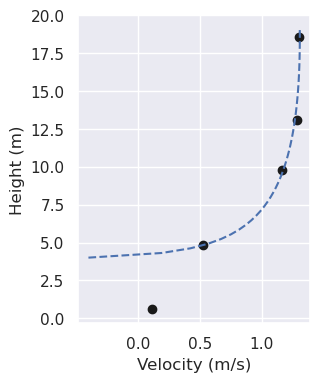

In [367]:
plt.figure(figsize=(3,4))
plt.scatter(prof1,hts,c='k')
plt.plot(outs,zs,'b--')
plt.xlabel('Velocity (m/s)')
plt.ylabel('Height (m)')


In [227]:
zs[-3]

18.47408163265306

In [223]:
DUDZ[-13]

0.0003700128142292147

In [241]:
swin=wind[:,m8][:,10025:10125]
DUDZ=np.zeros((48,50))
outsU=np.zeros((48,50))
for j in range(48):
    hts=[.59,4.81,9.78,13.07,18.59]
    bcd,out=optimize.curve_fit(intT,hts[1:],swin[1:,j])
    zs=np.linspace(zd+.1,hts[-1]+.5,50) #np.linspace(hts[-1]-.5,hts[-1]+.5,11)
    outs=intT(zs,bcd[0],bcd[1],bcd[2])
    outsU[j,:]=outs
    DUDZ[j,:]=np.gradient(outs,zs)

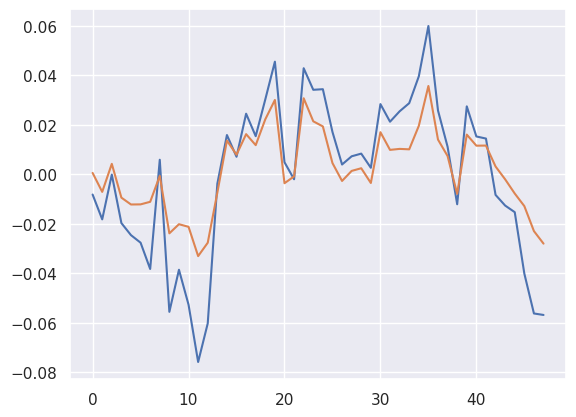

In [242]:
plt.plot(DUDZ[:,-3])
plt.plot((swin[-1,0:48]-swin[-2,0:48])/10)

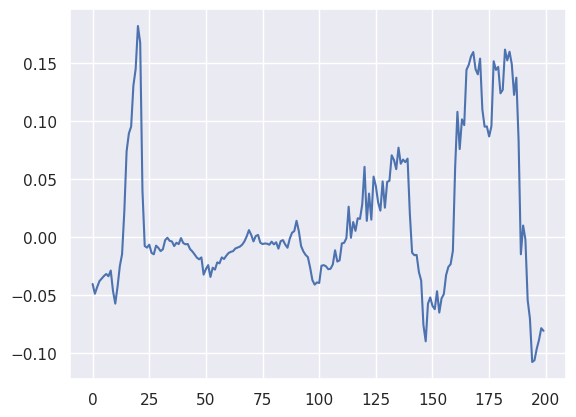

In [255]:
dtdz2=dtdz[dtdz>-999]
plt.plot(dtdz2[10000:10200])

In [259]:
np.argmax((np.array(hts)-zd)>0)

1

In [260]:
fpa.close()

In [290]:
fp.close()

In [328]:
300*(101325/101000)**(2/7)

300.27549690645213

In [329]:
fp4=h5py.File('/home/tsw35/soteria/data/NEON/dp04/UKFS/NEON.D06.UKFS.DP4.00200.001.nsae.2021-09.basic.h5','r')

In [335]:
fp4.close()

In [336]:
fp.close()

In [26]:
phim=.4*fp['tow_height'][:]/fp['USTAR'][:]*fp['DUDZ'][:]
rho=fp['RHO'][:]
H=fp['H'][:]/1005/rho
TSTAR=-H/fp['USTAR'][:]
phih=.4*fp['tow_height'][:]/TSTAR*fp['DTDZ'][:]

In [27]:
m=(zl<0)

MOSTphih=.96*(1-11.6*zl[m])**(-1/2)
MOSTphim=(1-19*zl[m])**(-1/4)

a=.48+1.8*y_b[m]
#a=.48+1.5*y_b[m]
STPphih=a*((3-2.5*zl[m])/(1-10*zl[m]+50*zl[m]**2))**(1/3)

a=(.24-.38*y_b[m])
a[y_b[m]>.6]=.012
b=.061
c=.45-.53*y_b[m]
n = -0.12 + 6.4*y_b[m]
STPphim=(a+b*(-zl[m])**(n))/(a+(-zl[m])**n)+c*(-zl[m])**(1/3)

In [451]:
from sklearn import metrics
#sklearn.metrics.r2_score

-0.0013878622232903481


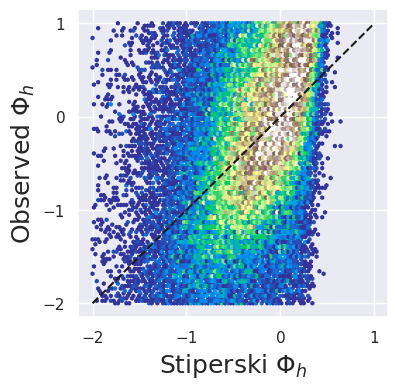

In [541]:
plt.figure(figsize=(4,4))
plt.hexbin(np.log(STPphih),np.log(phih[m]),cmap='terrain',mincnt=1,vmax=25,extent=(-2,1,-2,1))
plt.plot([-2,1],[-2,1],'k--')
#plt.xticks([0,.25,.5,.75,1,1.25,1.5])
#plt.yticks([0,.25,.5,.75,1,1.25,1.5])
plt.xticks([-2,-1,0,1])
plt.yticks([-2,-1,0,1])
plt.xlabel(r'Stiperski $\Phi_h$',fontsize=18)
plt.ylabel(r'Observed $\Phi_h$',fontsize=18)
print(metrics.r2_score(phih[m],STPphih))

-0.0017057168732343975


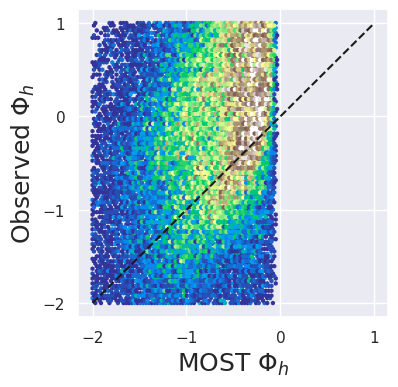

In [542]:
plt.figure(figsize=(4,4))
plt.hexbin(np.log(MOSTphih),np.log(phih[m]),vmax=25,cmap='terrain',mincnt=1,extent=(-2,1,-2,1))
plt.plot([-2,1],[-2,1],'k--')
#plt.xticks([0,.25,.5,.75,1,1.25,1.5])
#plt.yticks([0,.25,.5,.75,1,1.25,1.5])
plt.xticks([-2,-1,0,1])
plt.yticks([-2,-1,0,1])

plt.xlabel(r'MOST $\Phi_h$',fontsize=18)
plt.ylabel(r'Observed $\Phi_h$',fontsize=18)
print(metrics.r2_score(phih[m],MOSTphih))

0.0040375072704826875


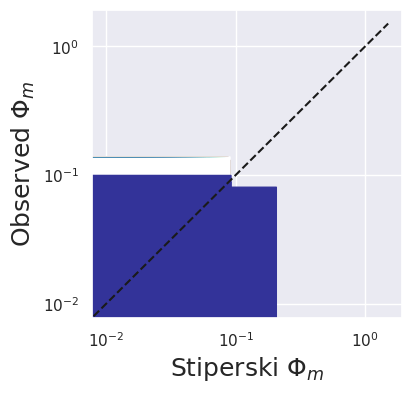

In [537]:
plt.figure(figsize=(4,4))
plt.hexbin(STPphim,phim[m],cmap='terrain',mincnt=1,vmax=25,extent=(.01,1.5,.01,1.5))
plt.plot([0,1.5],[0,1.5],'k--')
plt.xticks([0,.25,.5,.75,1,1.25,1.5])
plt.yticks([0,.25,.5,.75,1,1.25,1.5])
plt.xlabel(r'Stiperski $\Phi_m$',fontsize=18)
plt.ylabel(r'Observed $\Phi_m$',fontsize=18)
print(metrics.r2_score(phim[m],STPphim))

0.00201257524374554


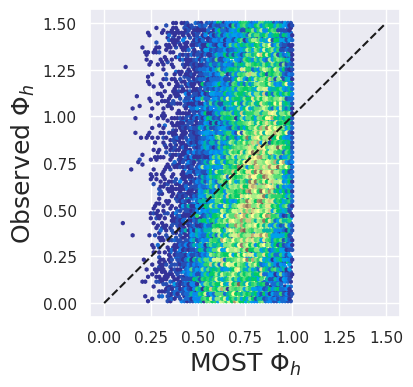

In [459]:
plt.figure(figsize=(4,4))
plt.hexbin(MOSTphim,phim[m],vmax=25,cmap='terrain',mincnt=1,extent=(.01,1.5,.01,1.5))
plt.plot([0,1.5],[0,1.5],'k--')
plt.xticks([0,.25,.5,.75,1,1.25,1.5])
plt.yticks([0,.25,.5,.75,1,1.25,1.5])
plt.xlabel(r'MOST $\Phi_h$',fontsize=18)
plt.ylabel(r'Observed $\Phi_h$',fontsize=18)
print(metrics.r2_score(phim[m],MOSTphim))

In [15]:
def stpphih(zl_,yb):
    a=.48+1.8*yb
    return a*((3-2.5*zl_)/(1-10*zl_+50*zl_**2))**(1/3)

In [16]:
def stpphim(zl_,yb):
    a=(.24-.38*yb)
    if yb>.6:
        a=.012
    b=.061
    c=.45-.53*yb
    n = -0.12 + 6.4*yb
    return (a+b*(-zl_)**(n))/(a+(-zl_)**n)+c*(-zl_)**(1/3)


Text(0, 0.5, '$\\Phi_h$')

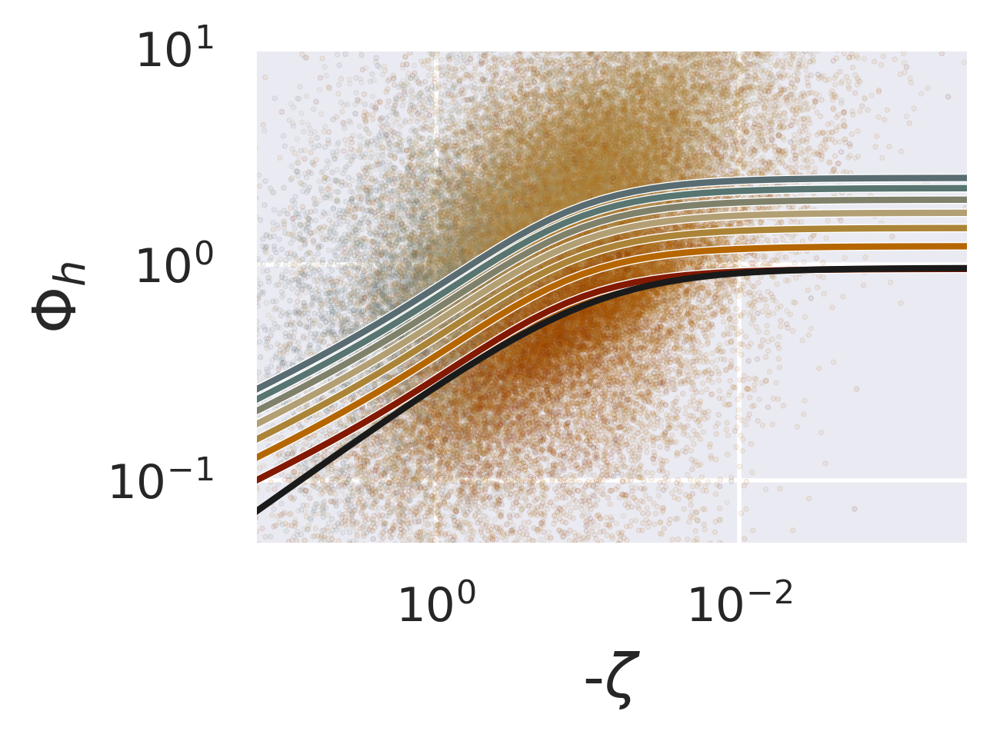

In [23]:
binlist=[.05,.15,.25,.35,.45,.55,.65,.75]
import matplotlib.patheffects as pe
plt.figure(figsize=(5*.6,3.5*.6),dpi=400)

m=(zl<0.000001)&(phih>=0)
ybnorm=np.array(y_b)[m]
ybnorm=ybnorm/(.7)
colors=cmap(ybnorm)
un=phih[m]
plt.scatter(-zl[m],un,alpha=.15,s=.1,color=colors,label=None)
plt.xscale('log')
plt.yscale('log')


colors = ["#410d00","#831901","#b56601","#ab8437",
             "#b29f74","#7f816b","#587571","#596c72"]
binlist=[.05,.15,.25,.35,.45,.55,.65,.75]

zlfake=-np.logspace(-4,1.5,50)
for i in range(1,8):
    STPphih=stpphih(zlfake,(binlist[i]+binlist[i-1])/2)
    plt.plot(-zlfake,STPphih,color=colors[i],path_effects=[pe.Stroke(linewidth=2, foreground='w'), pe.Normal()])

MOSTphih=.96*(1-11.6*zlfake)**(-1/2)
plt.plot(-zlfake,MOSTphih,'k')
#plt.legend(loc='upper right',title=r'$y_b$',ncol=2,handlelength=1)
plt.ylim(5*10**(-2),10**1)
plt.xlim(3*10**(-4),10**(1.2))
#plt.legend([r'$y_b=.1$',r'$y_b=.2$',r'$y_b=.3$',r'$y_b=.4$',r'$y_b=.5$',r'$y_b=.6$',r'$y_b=.7$','MOST'])
#plt.xticks([10,1,.1,.01,.001],[r'$-10^1$',r'$-10^0$',r'$-10^{-1}$',r'$-10^{-2}$',r'$-10^{-3}$'])
plt.gca().invert_xaxis()
plt.xlabel(r'-$\zeta$',fontsize=14)
plt.ylabel(r'$\Phi_h$',fontsize=14)

Text(0, 0.5, '$\\Phi_m$')

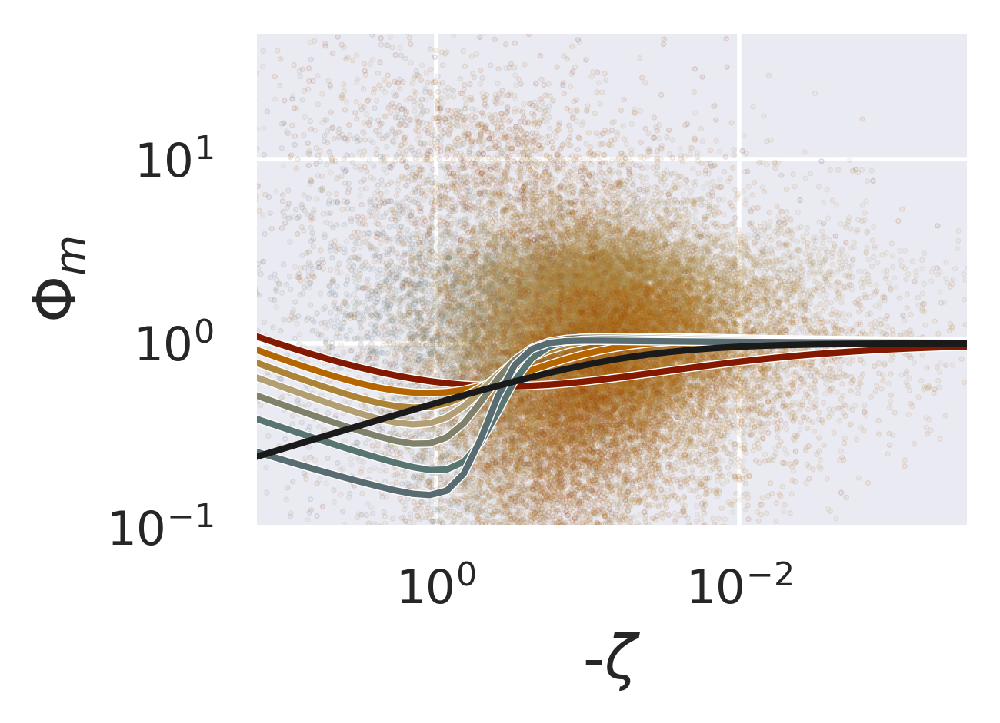

In [524]:
binlist=[.05,.15,.25,.35,.45,.55,.65,.75]
import matplotlib.patheffects as pe
plt.figure(figsize=(5*.6,3.5*.6),dpi=400)

m=(zl<0.000001)&(phim>=0)
ybnorm=np.array(y_b)[m]
ybnorm=ybnorm/(.7)
colors=cmap(ybnorm)
un=phim[m]
plt.scatter(-zl[m],un,alpha=.15,s=.1,color=colors,label=None)
plt.xscale('log')
plt.yscale('log')

zlfake=-np.logspace(-4,1.5,50)

colors = ["#410d00","#831901","#b56601","#ab8437",
             "#b29f74","#7f816b","#587571","#596c72"]
binlist=[.05,.15,.25,.35,.45,.55,.65,.75]

zlfake=-np.logspace(-4,1.5,50)
for i in range(1,8):
    STPphim=stpphim(zlfake,(binlist[i]+binlist[i-1])/2)
    plt.plot(-zlfake,STPphim,color=colors[i],path_effects=[pe.Stroke(linewidth=2, foreground='w'), pe.Normal()])

MOSTphim=(1-19*zlfake)**(-1/4)
plt.plot(-zlfake,MOSTphim,'k')

#plt.legend(loc='upper right',title=r'$y_b$',ncol=2,handlelength=1)
plt.ylim(10**(-1),5*10**1)
plt.xlim(3*10**(-4),10**(1.2))
#plt.xticks([10,1,.1,.01,.001],[r'$-10^1$',r'$-10^0$',r'$-10^{-1}$',r'$-10^{-2}$',r'$-10^{-3}$'])
plt.gca().invert_xaxis()
plt.xlabel(r'-$\zeta$',fontsize=14)
plt.ylabel(r'$\Phi_m$',fontsize=14)

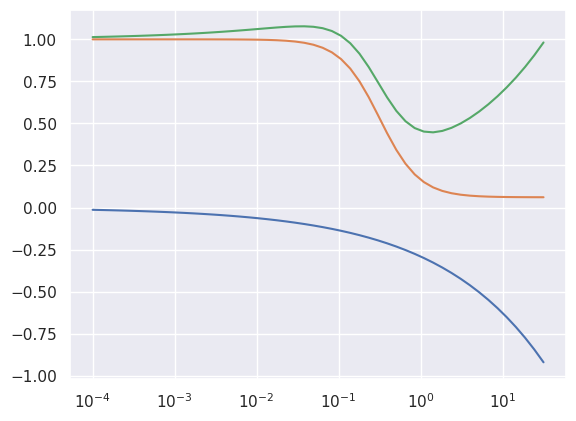

In [512]:
yb=.3
a=(.24-.38*yb)
b=.061
c=.45-.53*yb
n = -0.12 + 6.4*yb
#(a+b*(-zl_)**(n))/(a+(-zl_)**n)-c*(-zl_)**(1/3)
plt.plot(-zlfake,-c*(-zlfake)**(1/3))
plt.plot(-zlfake,(a+b*(-zlfake)**(n))/(a+(-zlfake)**n))
plt.plot(-zlfake,(a+b*(-zlfake)**(n))/(a+(-zlfake)**n)+c*(-zlfake)**(1/3))

plt.xscale('log')

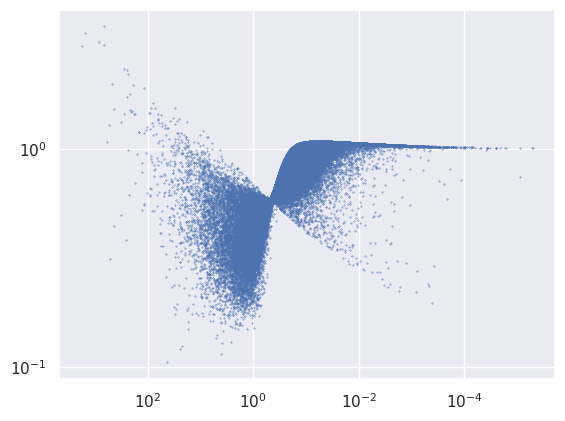

In [522]:
plt.scatter(-zl[m],STPphim,s=.1)
plt.xscale('log')
plt.yscale('log')
plt.gca().invert_xaxis()


In [28]:
SS_h=1-np.median(np.abs(np.log(phih[m])-np.log(STPphih)))/np.median(np.abs(np.log(phih[m])-np.log(MOSTphih)))
SS_m=1-np.nanmedian(np.abs(np.log(phim[m])-np.log(STPphim)))/np.nanmedian(np.abs(np.log(phim[m])-np.log(MOSTphim)))



/stor/soteria/hydro/private/tsw35/software/miniconda/envs/jenv/lib/python3.7/site-packages/ipykernel_launcher.py:2: RuntimeWarning: invalid value encountered in log
  


In [29]:
SS_h

0.282383511146298

In [30]:
SS_m

0.08976605930078141

In [53]:
m2=zl[m]>-.01
SS_h=1-np.median(np.abs(np.log(phih[m][m2])-np.log(STPphih[m2])))/np.median(np.abs(np.log(phih[m][m2])-np.log(MOSTphih[m2])))
SS_m=1-np.nanmedian(np.abs(np.log(phim[m][m2])-np.log(STPphim[m2])))/np.nanmedian(np.abs(np.log(phim[m][m2])-np.log(MOSTphim[m2])))

/stor/soteria/hydro/private/tsw35/software/miniconda/envs/jenv/lib/python3.7/site-packages/ipykernel_launcher.py:3: RuntimeWarning: invalid value encountered in log
  This is separate from the ipykernel package so we can avoid doing imports until


In [54]:
print(SS_h)
print(SS_m)

0.16478225653960676
0.025462069269775234


In [56]:
zl=fp['ZL'][:]
SSh={}
SSm={}

for site in sites:
    m = (fpsites[:]==site)&(zl<0)
    MOSTphih=.96*(1-11.6*zl[m])**(-1/2)
    MOSTphim=(1-19*zl[m])**(-1/4)

    a=.48+1.8*y_b[m]
    #a=.48+1.5*y_b[m]
    STPphih=a*((3-2.5*zl[m])/(1-10*zl[m]+50*zl[m]**2))**(1/3)

    a=(.24-.38*y_b[m])
    a[y_b[m]>.6]=.012
    b=.061
    c=.45-.53*y_b[m]
    n = -0.12 + 6.4*y_b[m]
    STPphim=(a+b*(-zl[m])**(n))/(a+(-zl[m])**n)+c*(-zl[m])**(1/3)

    SSh[site]=1-np.median(np.abs(np.log(phih[m])-np.log(STPphih)))/np.median(np.abs(np.log(phih[m])-np.log(MOSTphih)))
    SSm[site]=1-np.nanmedian(np.abs(np.log(phim[m])-np.log(STPphim)))/np.nanmedian(np.abs(np.log(phim[m])-np.log(MOSTphim)))


/stor/soteria/hydro/private/tsw35/software/miniconda/envs/jenv/lib/python3.7/site-packages/ipykernel_launcher.py:22: RuntimeWarning: invalid value encountered in log


[{b'UNDE': 41.0, b'RMNP': 42.0, b'JORN': 52.0, b'WREF': 42.0, b'DCFS': 71.0, b'UKFS': 41.0, b'NOGP': 71.0, b'TEAK': 42.0, b'GUAN': 42, b'BONA': 43, b'KONZ': 71.0, b'DSNY': 81.0, b'CPER': 71.0, b'KONA': 82.0, b'ONAQ': 52.0, b'BARR': 72, b'MOAB': 52.0, b'GRSM': 43.0, b'HARV': 41.0, b'STEI': 41.0, b'HEAL': 52, b'ABBY': 42.0, b'SCBI': 41.0, b'TREE': 41.0, b'WOOD': 71.0, b'OSBS': 42.0, b'MLBS': 41.0, b'BART': 41.0, b'NIWO': 52.0, b'SOAP': 42.0, b'TALL': 42.0, b'ORNL': 41.0, b'SJER': 52.0, b'SERC': 41.0, b'SRER': 52.0, b'CLBJ': 41.0, b'TOOL': 51, b'JERC': 43.0, b'LENO': 90.0, b'OAES': 71.0, b'DEJU': 42, b'LAJA': 81}]


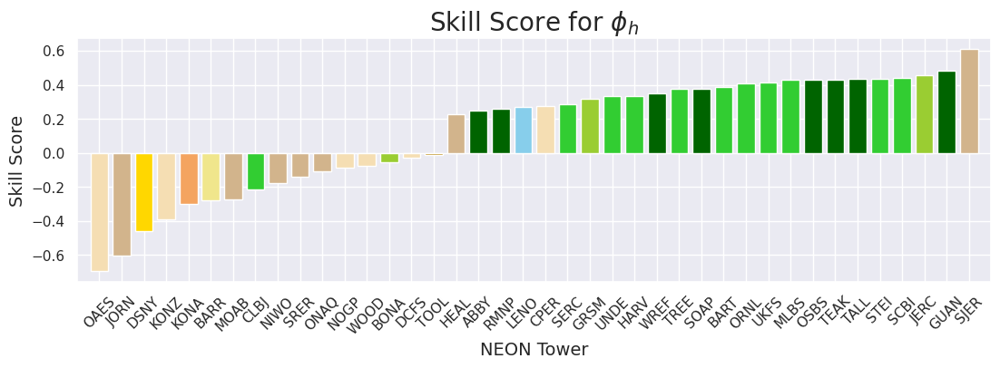

In [59]:

# ------------------------------------ #
# Figure 9 (Original) Slopes Bar Graph #
# ------------------------------------ #
from matplotlib.patches import Patch

dom_color=[]
ybs1=[]
nme=[]

plt.figure(figsize=(13,3.5))
ordered_sitelist=[]
flip_ybs={}
for k in SSh.keys():
    flip_ybs[SSh[k]]=k
ybs_list=list(flip_ybs.keys())
ybs_list.sort()
for k in ybs_list:
    ordered_sitelist.append(flip_ybs[k])
#plt.plot([-2,40],[1,1],'--',c='black',alpha=.5)
print(np.unique(site_nlcd_dom))
for site in ordered_sitelist:
    dom_color.append(class_colors[site_nlcd_dom[site]])
    ybs1.append(SSh[site])
    nme.append(str(site)[2:-1])

bar1 = plt.bar(nme,ybs1,color=dom_color)
#plt.ylim(.93,1.6)
plt.xticks(rotation=45)
#plt.xlim(-1,39)
i=0
#for rect in bar1:
#    height = rect.get_height()
#    plt.text(rect.get_x() + rect.get_width()/2.0, height,str(int(round(errs[i]*100))), ha='center', va='bottom',color='r')
#    i=i+1

#print(site_nlcd_dom.values())
#plt.title('Best Fit Slope by Site with Landcover Type with Error')
#plt.ylabel('Best Fit Slope')
legend_elements=[]
keep_nlcds=[41,42,43,52,71,81,82,90]
for x in keep_nlcds:
    legend_elements.append(Patch(facecolor=class_colors[x], edgecolor='k',label=class_names[x]))
plt.legend(title='Dominant Landcover',handles=legend_elements)
#plt.ylim(.15,.35)
plt.xlim(-1,40)
plt.xlabel('NEON Tower',fontsize=14)
plt.ylabel('Skill Score',fontsize=14)
plt.title(r'Skill Score for $\phi_h$',fontsize=20)
plt.show()

[{b'UNDE': 41.0, b'RMNP': 42.0, b'JORN': 52.0, b'WREF': 42.0, b'DCFS': 71.0, b'UKFS': 41.0, b'NOGP': 71.0, b'TEAK': 42.0, b'GUAN': 42, b'BONA': 43, b'KONZ': 71.0, b'DSNY': 81.0, b'CPER': 71.0, b'KONA': 82.0, b'ONAQ': 52.0, b'BARR': 72, b'MOAB': 52.0, b'GRSM': 43.0, b'HARV': 41.0, b'STEI': 41.0, b'HEAL': 52, b'ABBY': 42.0, b'SCBI': 41.0, b'TREE': 41.0, b'WOOD': 71.0, b'OSBS': 42.0, b'MLBS': 41.0, b'BART': 41.0, b'NIWO': 52.0, b'SOAP': 42.0, b'TALL': 42.0, b'ORNL': 41.0, b'SJER': 52.0, b'SERC': 41.0, b'SRER': 52.0, b'CLBJ': 41.0, b'TOOL': 51, b'JERC': 43.0, b'LENO': 90.0, b'OAES': 71.0, b'DEJU': 42, b'LAJA': 81}]


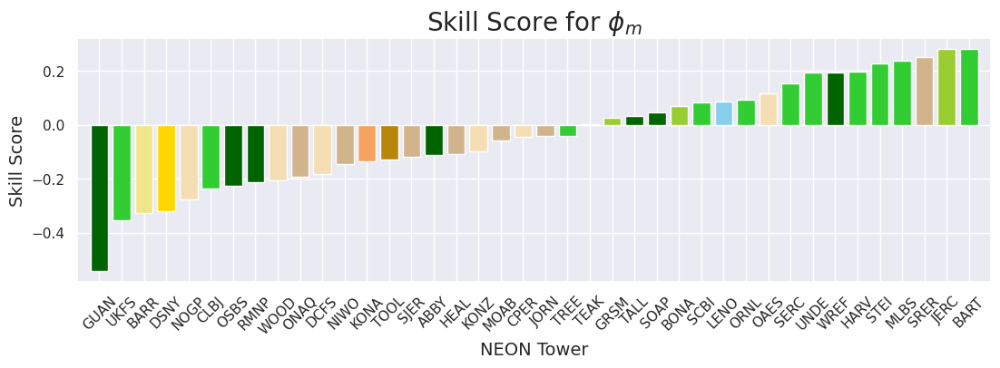

In [60]:

# ------------------------------------ #
# Figure 9 (Original) Slopes Bar Graph #
# ------------------------------------ #
from matplotlib.patches import Patch

dom_color=[]
ybs1=[]
nme=[]

plt.figure(figsize=(13,3.5))
ordered_sitelist=[]
flip_ybs={}
for k in SSm.keys():
    flip_ybs[SSm[k]]=k
ybs_list=list(flip_ybs.keys())
ybs_list.sort()
for k in ybs_list:
    ordered_sitelist.append(flip_ybs[k])
#plt.plot([-2,40],[1,1],'--',c='black',alpha=.5)
print(np.unique(site_nlcd_dom))
for site in ordered_sitelist:
    dom_color.append(class_colors[site_nlcd_dom[site]])
    ybs1.append(SSm[site])
    nme.append(str(site)[2:-1])

bar1 = plt.bar(nme,ybs1,color=dom_color)
#plt.ylim(.93,1.6)
plt.xticks(rotation=45)
#plt.xlim(-1,39)
i=0
#for rect in bar1:
#    height = rect.get_height()
#    plt.text(rect.get_x() + rect.get_width()/2.0, height,str(int(round(errs[i]*100))), ha='center', va='bottom',color='r')
#    i=i+1

#print(site_nlcd_dom.values())
#plt.title('Best Fit Slope by Site with Landcover Type with Error')
#plt.ylabel('Best Fit Slope')
legend_elements=[]
keep_nlcds=[41,42,43,52,71,81,82,90]
for x in keep_nlcds:
    legend_elements.append(Patch(facecolor=class_colors[x], edgecolor='k',label=class_names[x]))
#plt.legend(title='Dominant Landcover',handles=legend_elements)
#plt.ylim(.15,.35)
plt.xlim(-1,40)
plt.xlabel('NEON Tower',fontsize=14)
plt.ylabel('Skill Score',fontsize=14)
plt.title(r'Skill Score for $\phi_m$',fontsize=20)
plt.show()

In [554]:
site=b'JORN'

In [555]:
m = (fpsites[:]==site)&(zl<0)
MOSTphih=.96*(1-11.6*zl[m])**(-1/2)
MOSTphim=(1-19*zl[m])**(-1/4)

a=.48+1.8*y_b[m]
#a=.48+1.5*y_b[m]
STPphih=a*((3-2.5*zl[m])/(1-10*zl[m]+50*zl[m]**2))**(1/3)

a=(.24-.38*y_b[m])
a[y_b[m]>.6]=.012
b=.061
c=.45-.53*y_b[m]
n = -0.12 + 6.4*y_b[m]
STPphim=(a+b*(-zl[m])**(n))/(a+(-zl[m])**n)+c*(-zl[m])**(1/3)

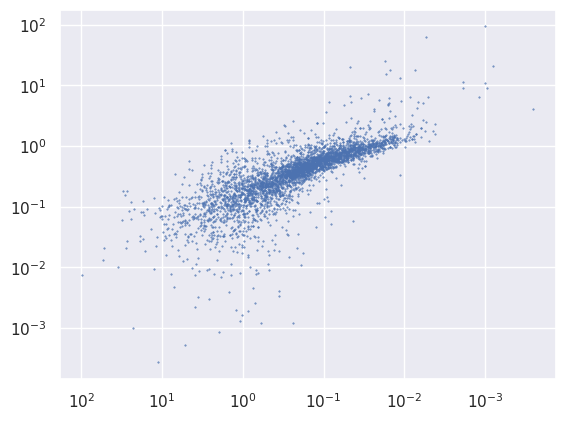

In [557]:
plt.scatter(-zl[m],phih[m],s=.2)
plt.xscale('log')
plt.yscale('log')
zlfake=-np.logspace(-4,1.5,50)
for i in range(1,8):
    STPphih=stpphih(zlfake,(binlist[i]+binlist[i-1])/2)
    plt.plot(-zlfake,STPphih,color=colors[i],path_effects=[pe.Stroke(linewidth=2, foreground='w'), pe.Normal()])

MOSTphih=.96*(1-11.6*zlfake)**(-1/2)
plt.plot(-zlfake,MOSTphih,'k')
plt.gca().invert_xaxis()

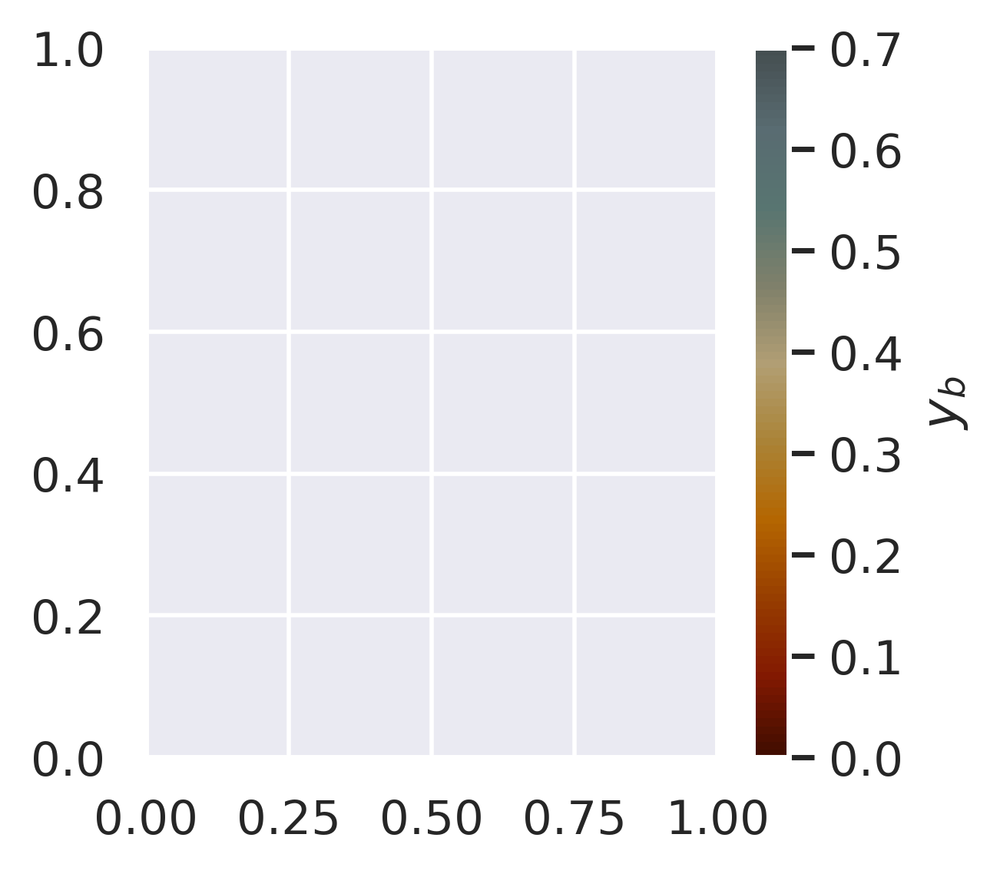

In [22]:
plt.figure(figsize=(3,3),dpi=400)
norm = mpl.colors.Normalize(vmin=0, vmax=.7)
plt.colorbar(mpl.cm.ScalarMappable(norm=norm, cmap=cmap),label=r'$y_b$')

In [4]:
fp=h5py.File('/home/tsw35/soteria/neon_advanced/qaqc_data/NEON_TW_U_UVWT.h5','r')

In [5]:
fp.keys()

<KeysViewHDF5 ['ANI_XB', 'ANI_YB', 'CO2', 'CO2FX', 'CO2_SIGMA', 'DAY', 'G', 'H', 'H2O', 'H2O_SIGMA', 'LE', 'LW_IN', 'LW_OUT', 'L_MOST', 'NETRAD', 'P', 'PA', 'RH', 'RHO', 'SITE', 'SW_IN', 'SW_OUT', 'TA', 'TIME', 'T_SONIC', 'T_SONIC_SIGMA', 'U', 'USTAR', 'UU', 'UV', 'UW', 'U_SIGMA', 'Ustr', 'V', 'VPD', 'VPT', 'VV', 'VW', 'V_SIGMA', 'Vstr', 'W', 'WS', 'WTHETA', 'WW', 'W_SIGMA', 'Wstr', 'canopy_height', 'elevation', 'lat', 'lon', 'nlcd11', 'nlcd12', 'nlcd21', 'nlcd22', 'nlcd23', 'nlcd24', 'nlcd31', 'nlcd41', 'nlcd42', 'nlcd43', 'nlcd51', 'nlcd52', 'nlcd71', 'nlcd72', 'nlcd73', 'nlcd74', 'nlcd81', 'nlcd82', 'nlcd90', 'nlcd95', 'nlcd_dom', 'tow_height', 'utc_off', 'zd']>

In [6]:
import matplotlib.patheffects as pe
import matplotlib as mpl
import matplotlib


In [7]:
vmx_a=.7
vmn_a=.1
indir='/home/tsw35/soteria/neon_advanced/qaqc_data/'

In [8]:
iva_colors_HEX = ["#410d00","#831901","#983e00","#b56601","#ab8437",
              "#b29f74","#7f816b","#587571","#596c72","#454f51"]
#Transform the HEX colors to RGB.
from PIL import ImageColor
iva_colors_RGB = np.zeros((np.size(iva_colors_HEX),3),dtype='int')
for i in range(0,np.size(iva_colors_HEX)):
    iva_colors_RGB[i,:] = ImageColor.getcolor(iva_colors_HEX[i], "RGB")
iva_colors_RGB = iva_colors_RGB[:,:]/(256)
colors = iva_colors_RGB.tolist()
#----------------------------------------------------
from matplotlib.colors import LinearSegmentedColormap,ListedColormap
inbetween_color_amount = 10
newcolvals = np.zeros(shape=(10 * (inbetween_color_amount) - (inbetween_color_amount - 1), 3))
newcolvals[0] = colors[0]
for i, (rgba1, rgba2) in enumerate(zip(colors[:-1], np.roll(colors, -1, axis=0)[:-1])):
    for j, (p1, p2) in enumerate(zip(rgba1, rgba2)):
        flow = np.linspace(p1, p2, (inbetween_color_amount + 1))
        # discard first 1 since we already have it from previous iteration
        flow = flow[1:]
        newcolvals[ i * (inbetween_color_amount) + 1 : (i + 1) * (inbetween_color_amount) + 1, j] = flow
newcolvals
cmap_ani = ListedColormap(newcolvals, name='from_list', N=None)

In [9]:
def cani_norm(x):
    try:
        x_=x.copy()
        x_[x_<vmn_a]=vmn_a
        x_[x_>vmx_a]=vmx_a
    except:
        x_=x.copy()
        if x_>vmx_a:
            x_=vmx_a
        elif x_<vmn_a:
            x_=vmn_a
    
    x_=(x_-vmn_a)/(vmx_a-vmn_a)
    return cmap_ani(x_)

In [10]:
zL=(fp['tow_height'][:]-fp['zd'][:])/fp['L_MOST'][:]
ani=fp['ANI_YB'][:]

In [11]:
m=np.zeros((len(zL),))
m[0:10000]=1
np.random.shuffle(m)
m=m.astype(bool)

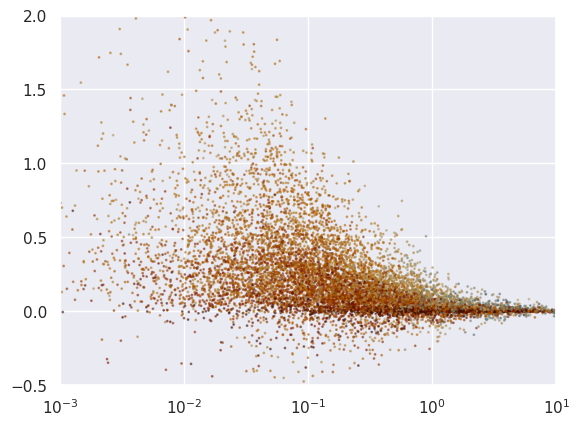

In [14]:
plt.scatter(-zL[m],pvw[m],s=1,color=cani_norm(ani[m]),alpha=.5)
plt.xlim(.001,10)
plt.ylim(-.5,2)
plt.xscale('log')

In [15]:
def binplot1d(xx,yy,ani,xbins,anibins=np.array([-.05,.05,.15,.25,.35,.45,.55,.65,.75,.85]),mincnt=10):
    xplot=(xbins[0:-1]+xbins[1:])/2
    yplot=np.zeros((len(anibins)-1,len(xplot)))
    aniplot=(anibins[0:-1]+anibins[1:])/2
    for i in range(len(anibins)-1):
        for j in range(len(xbins)-1):
            pnts=yy[(ani>=anibins[i])&(ani<anibins[i+1])&(xx>=xbins[j])&(xx<xbins[j+1])]
            if len(pnts)<mincnt:
                yplot[i,j]=float('nan')
            else:
                yplot[i,j]=np.nanmedian(pnts)
    return xplot,yplot,aniplot

In [13]:
sigu=np.sqrt(fp['UU'][:])
sigv=np.sqrt(fp['VV'][:])
sigw=np.sqrt(fp['WW'][:])
pvw=fp['VW'][:]
puv=fp['UV'][:]
puw=fp['UW'][:]
ani=fp['ANI_YB'][:]
ustar=fp['USTAR'][:]
lmost=fp['L_MOST'][:]
zzd=fp['tow_height'][:]-fp['zd'][:]

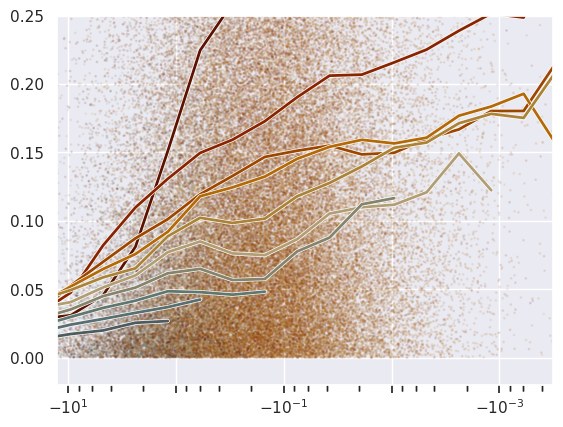

In [47]:
xplt,yplt,aplt=binplot1d(zzd/lmost,np.abs(puv),ani,-(np.logspace(-4,2,21)[-1:0:-1]),np.linspace(vmn_a,vmx_a,11),mincnt=50)
xx=-(zzd/lmost)
yy=np.abs(puv)
cc=cani_norm(ani)
m=np.zeros((len(cc),))
m[0:100000]=1
np.random.shuffle(m)
m=m.astype(bool)
plt.scatter(xx[m],yy[m],color=cc[m],s=1,alpha=.1)

for i in range(yplt.shape[0]):
    plt.semilogx(-xplt,yplt[i,:],color=cani_norm(aplt[i]),linewidth=2,path_effects=[pe.Stroke(linewidth=3, foreground='w'), pe.Normal()])

ax=plt.gca()
ax.tick_params(which="both", bottom=True)
locmin = matplotlib.ticker.LogLocator(base=10.0, subs=(0.1,0.2,0.4,0.6,0.8,1,2,4,6,8,10 )) 
ax.xaxis.set_minor_locator(locmin)
ax.xaxis.set_minor_formatter(matplotlib.ticker.NullFormatter())
ax.set_xticks([10**-3,10**-2,10**-1,1,10],[r'$-10^{-3}$','',r'$-10^{-1}$','',r'$-10^{1}$'])
ax.set_xlim(10**(-3.5),10**(1.1))
plt.ylim(-.02,.25)
plt.gca().invert_xaxis()

(-0.05, 0.5)

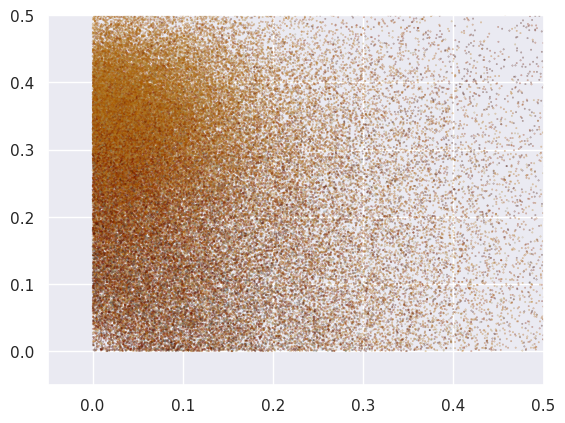

In [121]:
plt.scatter(np.abs(puw[m])/sigu[m]/sigw[m],np.abs(pvw[m])/sigv[m]/sigw[m],color=cc[m],s=.1,alpha=.5)
plt.xlim(-.05,.5)
plt.ylim(-.05,.5)

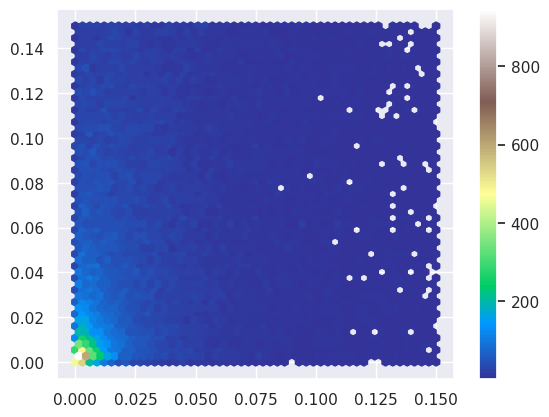

In [18]:
plt.hexbin(np.abs(puw[m]),np.abs(pvw[m]),mincnt=1,cmap='terrain',gridsize=50,extent=(0,.15,0,.15))
plt.colorbar()

In [143]:
def cart2pol(x, y):
    rho = np.sqrt(x**2 + y**2)
    phi = np.arctan2(y, x)
    return(rho, phi)

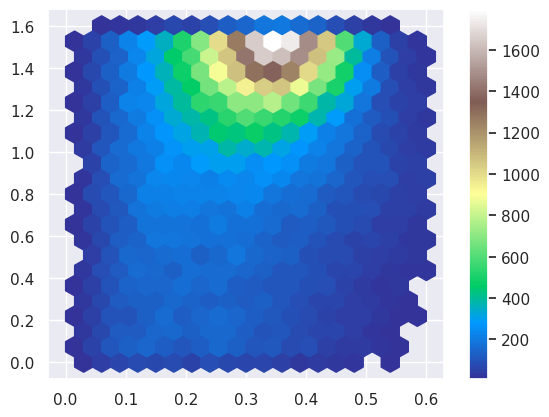

In [147]:
rho,phi=cart2pol(np.abs(puw[m])/sigu[m]/sigw[m],np.abs(pvw[m])/sigv[m]/sigw[m])
plt.hexbin(rho,phi,mincnt=10,cmap='terrain',gridsize=20,extent=(0,.6,0,1.6))
plt.colorbar()

(array([5.240e+02, 3.111e+03, 4.287e+03, 4.793e+03, 5.555e+03, 6.087e+03,
        6.406e+03, 6.799e+03, 6.804e+03, 6.691e+03, 6.373e+03, 5.977e+03,
        5.325e+03, 4.798e+03, 4.227e+03, 3.703e+03, 3.283e+03, 2.765e+03,
        2.375e+03, 1.907e+03, 1.571e+03, 1.263e+03, 1.028e+03, 9.060e+02,
        6.820e+02, 5.510e+02, 4.410e+02, 3.420e+02, 2.600e+02, 2.190e+02,
        1.800e+02, 1.470e+02, 1.210e+02, 8.200e+01, 6.300e+01, 6.400e+01,
        5.500e+01, 4.600e+01, 3.500e+01, 2.500e+01, 2.500e+01, 2.100e+01,
        1.500e+01, 1.400e+01, 8.000e+00, 7.000e+00, 7.000e+00, 5.000e+00,
        3.000e+00]),
 array([0.        , 0.04081633, 0.08163265, 0.12244898, 0.16326531,
        0.20408163, 0.24489796, 0.28571429, 0.32653061, 0.36734694,
        0.40816327, 0.44897959, 0.48979592, 0.53061224, 0.57142857,
        0.6122449 , 0.65306122, 0.69387755, 0.73469388, 0.7755102 ,
        0.81632653, 0.85714286, 0.89795918, 0.93877551, 0.97959184,
        1.02040816, 1.06122449, 1.10204082, 1.1

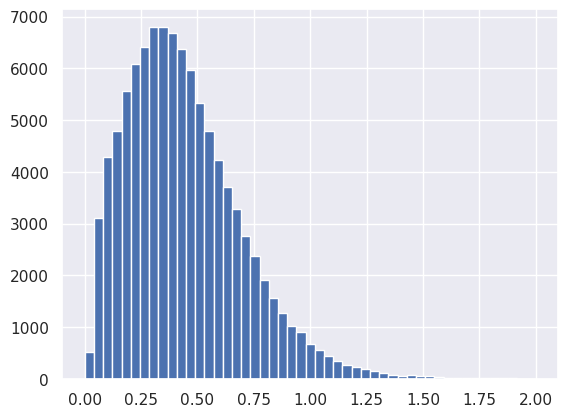

In [139]:
plt.hist(fp['USTAR'][m],bins=np.linspace(0,2))

In [2]:
fp=h5py.File('/home/tsw35/soteria/neon_advanced/qaqc_data/NEON_TW_U_UVWT.h5','r')
fp.keys()

<KeysViewHDF5 ['ANI_XB', 'ANI_YB', 'CO2', 'CO2FX', 'CO2_SIGMA', 'DAY', 'G', 'H', 'H2O', 'H2O_SIGMA', 'LE', 'LW_IN', 'LW_OUT', 'L_MOST', 'NETRAD', 'P', 'PA', 'RH', 'RHO', 'SITE', 'SW_IN', 'SW_OUT', 'TA', 'TIME', 'T_SONIC', 'T_SONIC_SIGMA', 'U', 'USTAR', 'UU', 'UV', 'UW', 'U_SIGMA', 'Ustr', 'V', 'VPD', 'VPT', 'VV', 'VW', 'V_SIGMA', 'Vstr', 'W', 'WS', 'WTHETA', 'WW', 'W_SIGMA', 'Wstr', 'canopy_height', 'elevation', 'lat', 'lon', 'nlcd11', 'nlcd12', 'nlcd21', 'nlcd22', 'nlcd23', 'nlcd24', 'nlcd31', 'nlcd41', 'nlcd42', 'nlcd43', 'nlcd51', 'nlcd52', 'nlcd71', 'nlcd72', 'nlcd73', 'nlcd74', 'nlcd81', 'nlcd82', 'nlcd90', 'nlcd95', 'nlcd_dom', 'tow_height', 'utc_off', 'zd']>

In [20]:
def aniso(uu,vv,ww,uv,uw,vw):
    uu=np.array(uu)
    uv=np.array(uv)
    uw=np.array(uw)
    vv=np.array(vv)
    ww=np.array(ww)
    vw=np.array(vw)
    n=len(uu)
    m=uu>-9999
    k=uu[m]+vv[m]+ww[m]
    aniso=np.ones((n,3,3))*-1
    aniso[m,0,0]=uu[m]/k-1/3
    aniso[m,1,1]=vv[m]/k-1/3
    aniso[m,2,2]=ww[m]/k-1/3
    aniso[m,0,1]=uv[m]/k
    aniso[m,1,0]=uv[m]/k
    aniso[m,2,0]=uw[m]/k
    aniso[m,0,2]=uw[m]/k
    aniso[m,1,2]=vw[m]/k
    aniso[m,2,1]=vw[m]/k
    return aniso

In [6]:
btij=aniso(fp['UU'][:],fp['VV'][:],fp['WW'][:],fp['UV'][:],fp['UW'][:],fp['VW'][:])
y_b=np.zeros((len(fp['UU'][:]),))
for i in range(len(fp['UU'][:])):
    lam3=np.min(np.linalg.eig(btij[i,:,:])[0])
    y_b[i]=np.sqrt(3)/2*(3*lam3+1)

In [7]:
len(btij)

1310454

In [8]:
btij.shape

(1310454, 3, 3)

In [9]:
np.mean(btij,axis=0)

array([[ 0.0729379 , -0.00197564, -0.00147443],
       [-0.00197564,  0.13182625,  0.05379881],
       [-0.00147443,  0.05379881, -0.20476414]])

In [10]:
from random import randrange

In [12]:
N=1000
btij2=np.zeros((N,3,3))
for t in range(N):
    btij2[t,:,:]=btij[randrange(1310454),:,:]

In [15]:
y_b=np.zeros((N,))
for i in range(N):
    lam3=np.min(np.linalg.eig(btij2[i,:,:])[0])
    y_b[i]=np.sqrt(3)/2*(3*lam3+1)
    

(array([ 12.,  84., 242., 270., 202., 114.,  39.,  17.,  11.,   9.]),
 array([-0.23960775, -0.15776015, -0.07591254,  0.00593506,  0.08778266,
         0.16963026,  0.25147787,  0.33332547,  0.41517307,  0.49702068,
         0.57886828]),
 <BarContainer object of 10 artists>)

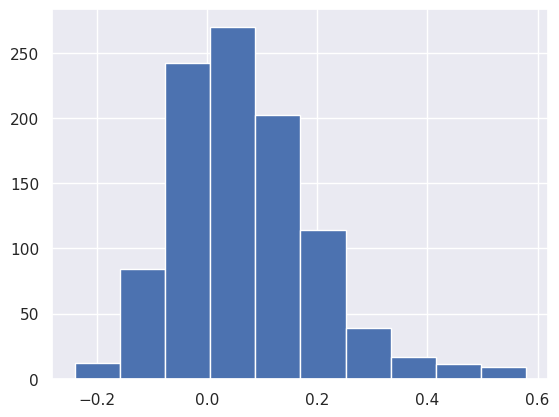

In [16]:
plt.hist(btij2[:,0,0])

In [17]:
bij=btij2[0]

In [33]:
uu=[.984]
vv=[1.159]
ww=[0.301]
uv=[-.128] #-.75,.75
uw=[.3]
vw=[.1]
bij=aniso(uu,vv,ww,uv,uw,vw)
lam3=np.min(np.linalg.eig(bij)[0])
yb=np.sqrt(3)/2*(3*lam3+1)
print(yb)

0.1789814964087102


In [44]:
rmin=-.3
rmax=.3
y_b=np.zeros((50,))
uu=[2]  #.1,5
vv=[4] #.1,6
ww=[0.301] #.02,1.5
uv=[.0075] #-.75,.75
uw=[-.05]  #-.3,.3
vw=[-.05]  #-.1,1
for i in range(50):
    uw=[np.linspace(rmin,rmax,50)[i]]
    bij=aniso(uu,vv,ww,uv,uw,vw)
    lam3=np.min(np.linalg.eig(bij)[0])
    y_b[i]=np.sqrt(3)/2*(3*lam3+1)

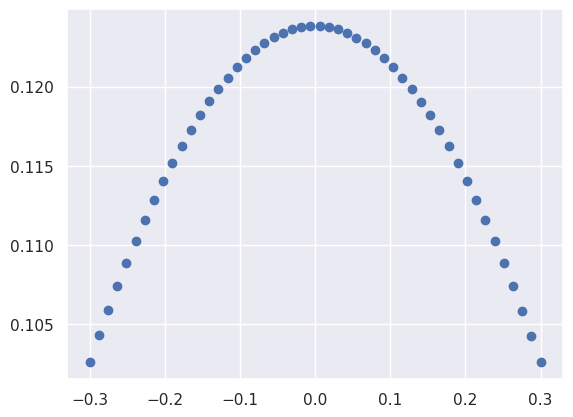

In [45]:
plt.scatter(np.linspace(rmin,rmax,50),y_b)

(array([  6954.,   9895.,  14570.,  24042.,  54650., 166334., 109189.,
         92923.,  82048.,  73273.,  65199.,  57756.,  51365.,  45345.,
         40453.,  35902.,  32585.,  28769.,  25760.,  23559.,  21253.,
         19106.,  17192.,  15536.,  14180.,  12902.,  11685.,  10617.,
          9749.,   8759.,   8019.,   7304.,   6729.,   5940.,   5460.,
          4950.,   4590.,   4301.,   3940.,   3643.,   3219.,   2998.,
          2753.,   2508.,   2446.,   2166.,   1966.,   1807.,   1745.]),
 array([-0.14121582, -0.11448271, -0.08774961, -0.0610165 , -0.0342834 ,
        -0.00755029,  0.01918281,  0.04591591,  0.07264902,  0.09938212,
         0.12611523,  0.15284833,  0.17958143,  0.20631454,  0.23304764,
         0.25978075,  0.28651385,  0.31324695,  0.33998006,  0.36671316,
         0.39344627,  0.42017937,  0.44691248,  0.47364558,  0.50037868,
         0.52711179,  0.55384489,  0.580578  ,  0.6073111 ,  0.6340442 ,
         0.66077731,  0.68751041,  0.71424352,  0.74097662,  0.

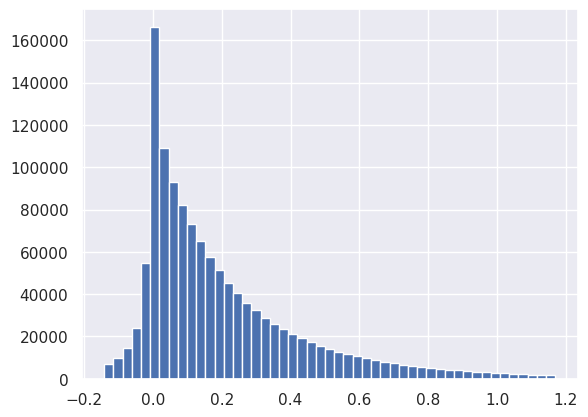

In [49]:
var='VW'
plt.hist(fp[var][:],bins=np.linspace(np.percentile(fp[var][:],2),np.percentile(fp[var][:],98)))

In [40]:
np.sum(uw_vw_r>0)/np.sum(uw_vw_r<0)

0.9076188063899103

(-0.05, 0.5)

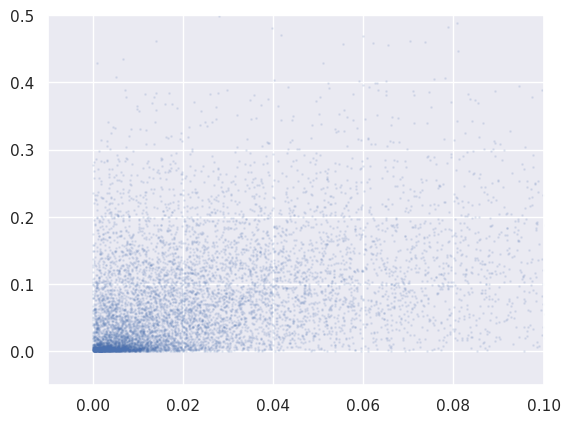

In [61]:
plt.scatter(np.abs(fp['UW'][0:10000]),np.abs(fp['VW'][0:10000]),alpha=.1,s=1)
plt.xlim(-.01,.1)
plt.ylim(-.05,.5)

In [62]:
from scipy import stats

In [110]:
stats.spearmanr(np.abs(fp['UV']),np.abs(fp['UW']))

SpearmanrResult(correlation=0.4025089307267752, pvalue=0.0)